In [1]:
import numpy as np
import os
import matplotlib.pyplot as plt
import pandas
import time
from astropy.io import fits

# Simbad queries
from astroquery.simbad import Simbad

# VizieR queries
from astroquery.vizier import Vizier

# Coordinates transformations and units
from astropy.coordinates import SkyCoord
from astropy.coordinates import Angle
import astropy.units as u

data_folder = '/datasets/phys164-fa19-public/lab3_sample_data/'
data_dir = '/home/tjancic/Data Lab 3/'
data_nickel_folder = '/home/tjancic/Data Lab 3/'
data_files = np.array(sorted(os.listdir(data_dir)))
data_nickel_files = os.listdir(data_nickel_folder)
data_nickel_files.sort()

In [2]:
def load_headers_all_files(headers):
    """ Reads and returns multiple FITS headers from all files.
    Relies on global variables data_dir and data_files """
    
    # All loaded headers will be saved here. np.full() creates a NumPy array of a given shape (first argument)
    # filled with a constant value (second argument, empty string in this case). "dtype = object" will allow
    # the array to store data of any type (some headers may be numbers, not strings).
    output = np.full([len(headers), len(data_files)], "", dtype = object)
    
    # Now read the headers from all files
    
    for y in range(len(headers)):
        for x in range(len(data_files)):
            hdu = fits.open(data_dir + data_files[x])
            output[y][x] = hdu[0].header[headers[y]]
            hdu.close()
    
    return output

def load_frame_overscan_remove_bias_subtract(filename):
    """ Find bias by taking average of rows of overscan and then subtracts the bias from the trimmed flat. 
    Uses data_dir and assumes the overscan is in extra columns and the final image is square."""
    
    hdu = fits.open(data_dir + filename)
    naxis1 = hdu[0].header['NAXIS1'] #finds number of columns
    OSregion = hdu[0].header['COVER'] #finds how many columns are overscan
    dimension = naxis1 - OSregion
    temp = np.array(hdu[0].data)
    overscan = temp[0:len(temp),dimension:naxis1]
    test_flat = temp[0:len(temp),0:dimension] #trim

    avg_rows_overscan = np.zeros(len(overscan))
    for i,y in enumerate(overscan):
        avg_rows_overscan[i] = np.average(y)

    #set each row of bias equal to row average of overscan
#     bias = np.array([avg_rows_overscan for y in range(dimension)]) 
#     bias = np.transpose(bias)
    bias = master_bias

    image = test_flat - bias
    hdu.close()
    
    return image

def load_reduced_science_frame(filename):
    """
    Loads a Science frame specified by the FITS file name,
    performs reduction through bias subtraction and normalized
    flat field correction and returns the data
    """
    
    
    hdu = fits.open(data_dir + filename)
    naxis1 = hdu[0].header['NAXIS1'] #finds number of columns
    OSregion = hdu[0].header['COVER'] #finds how many columns are overscan
    filter_name = hdu[0].header['FILTNAM']
    dimension = naxis1 - OSregion
    temp = np.array(hdu[0].data)
    overscan = temp[0:len(temp),dimension:naxis1]
    science = temp[0:len(temp),0:dimension] #trim

    avg_rows_overscan = np.zeros(len(overscan))
    for i,y in enumerate(overscan):
        avg_rows_overscan[i] = np.average(y)

    #set each row of bias equal to row average of overscan
#     bias = np.array([avg_rows_overscan for y in range(dimension)]) 
#     bias = np.transpose(bias)
    bias = master_bias

    image = science - bias
    hdu.close()
    
    #find flat image of same filter as science image
    
    filter_ind = [i for i in range(len(filter_names)) if filter_name in filter_names[i]]
    flat_ind = [i for i in range(len(object_names)) if "Flat" in object_names[i] or "FlatB" in object_names[i]]
    
    flat_file = [data_files[i] for i in range(len(data_files)) if i in filter_ind and i in flat_ind][0]
    
    #process flat
    flat = load_frame_overscan_remove_bias_subtract(flat_file)

    #normalize flat by median
    data_median = np.median(flat)
    flat_norm = flat/data_median
    
    #set broken column 256 equal to 1
    temp = np.transpose(flat_norm)
    temp[256].fill(1)
    flat_norm = np.transpose(temp)

    data = image/flat_norm
    
    temp = np.transpose(data)
    temp[256].fill(1)
    data = np.transpose(temp)
    
    return data

def find_star_locs(im_data, n_size = 10, bright_count_thresh=10,ratio = 2,selection = 0):
    """
    ARGUMENTS:
    ================================================================
    im_data - Reduced 2D FITS Data
    n_size  - Neighborhood size to consider for windowing (pixels)
    bright_count_thresh - Threshold for number of 'bright'pixels in
                          neighborhood to be considered a star.
                          (Proportional to size of Star blob)
    RETURNS:
    ================================================================
    [[x_positions_of_star_center, x_positions_of_star_center]]
    i.e., a list of list of x and y coordinate of star centers
    """
    
    x = range(len(im_data[0]))
    y = range(len(im_data))
    z = im_data
    peak_point_rows = []
    peak_point_cols = []
    list_pos = []
    thresh = np.median(im_data)*ratio
    
    j = 3
    
    #test per row where peaks are by checking neighbors
    if selection == 1:
        while j < len(y)-3:
            i = 3
            while i < len(x)-3:
                if z[j][i] > thresh:
                    if z[j][i-2] < z[j][i-1] and z[j][i-1] < z[j][i] \
                    and z[j][i] > z[j][i+1] and z[j][i+1] > z[j][i+2]:
                        peak_point_rows.append([i,j])

                i = i + 1
            j = j + 1

        #Do the same for columns
        i = 3
        while i < len(x)-3:
            j = 3
            while j < len(y)-3:
                if z[j][i] > thresh:
                    if z[j-2][i] < z[j-1][i] and z[j-1][i] < z[j][i] \
                    and z[j][i] > z[j+1][i] and z[j+1][i] > z[j+2][i]:
                        peak_point_cols.append([i,j])

                j = j + 1
            i = i + 1        
    else:
        while j < len(y)-3:
            i = 3
            while i < len(x)-3:
                if z[j][i] > thresh:
                    if z[j][i-3] < z[j][i-2] and z[j][i-2] < z[j][i-1] and z[j][i-1] < z[j][i] \
                    and z[j][i] > z[j][i+1] and z[j][i+1] > z[j][i+2] and z[j][i+2] > z[j][i+3]:
                        peak_point_rows.append([i,j])

                i = i + 1
            j = j + 1

        #Do the same for columns
        i = 3
        while i < len(x)-3:
            j = 3
            while j < len(y)-3:
                if z[j][i] > thresh:
                    if z[j-3][i] < z[j-2][i] and z[j-2][i] < z[j-1][i] and z[j-1][i] < z[j][i] \
                    and z[j][i] > z[j+1][i] and z[j+1][i] > z[j+2][i] and z[j+2][i] > z[j+3][i]:
                        peak_point_cols.append([i,j])

                j = j + 1
            i = i + 1
        
    #compare lists of peaks and if they are equal and have a minimum number of bright points in the region 
    #then they get assigned the the peak points
    for a in peak_point_rows:
        for b in peak_point_cols:
            if a == b:
                temp = z[a[1]-round(n_size/2):a[1]+round(n_size/2),a[0]-round(n_size/2):a[0]+round(n_size/2)]
                temp.flatten()
                brights = np.where(temp > thresh)[0]
                if len(brights) >= bright_count_thresh:
                    list_pos.append(a)
    
    return list_pos

def calc_centroids_2d(intarr, loc_list, window_max = 20):
    """
    Estimates centroids of stars based on their given pixel locations. Provides the centroids as well as 
    their error
    
    PARAMETERS:
    ==================================================================================
    intarr - data from image
    posarr - Not used because it's redundant
    loc_list - list of pixel location in stars in format (x,y)
    window_max - Size of Window to consider to find max pos of each star (in pixels)
    
    RETURNS:
    ==================================================================================
    centroids - List of list of centroid coordinates and corresponding uncertainities
                Format: [[xc, yc, unc_xc, unc_yc]]
    """
    
    centroids = [] # Append Tuples (xc, yc, xc_err, yc_err) of centroid coordinates
                   # No. of tuples should equal length of loc_list
    
    x = range(len(intarr[0]))
    y = range(len(intarr))
    z = intarr
    
    window = window_max
    
    for locx,locy in loc_list:
        xmin = int(locx) - int(window/2)
        xmax = int(locx) + int(window/2)
        if xmin < 0:
            x_px = range(0,xmax)
        elif xmax > len(z[0]):
            x_px = range(xmin,len(z[0]))
        else:
            x_px = range(xmin,xmax)
        x_values = z[locy][x_px]
        centroidx = np.sum(x_px*x_values)/np.sum(x_values)
        xc_err = np.sum(x_values*(x_px - centroidx)**2)/np.sum(x_values**2)
        
        ymin = int(locy) - int(window/2)
        ymax = int(locy) + int(window/2)
        if ymin < 0:
            y_px = range(0,ymax)
        elif ymax > len(z):
            y_px = range(ymin,len(z))
        else:
            y_px = range(ymin,ymax)
        y_values = np.transpose(z)[locx][y_px]
        centroidy = np.sum(y_px*y_values)/np.sum(y_values)
        yc_err = np.sum(y_values*(y_px - centroidy)**2)/np.sum(y_values**2)
        
        centroids.append([centroidx,centroidy,xc_err,yc_err])
    
    return np.array(centroids)

def Normalize_flat(data): #one image at a time, must be np.array
    data_median = np.median(data)
    new_data = data/data_median
    return new_data

# AUTOMATON ACTIVATE

In [3]:
#Things needed
#ra_center
#dec_center
#centroids_list
#mag_limit

#ra_center = '01:45:27.400'
#dec_center = '+05:47:35.03'
#mag_limit = 18.0


In [4]:
#input: centroids_list, ra_center, dec_center, mag_limit = 18, fov = '6.3m',
#output: ra_cat, dec_cat,
def Viz_coord(centroids_list,ra_center,dec_center,magnitude_limit = 18.0, fov = '6.3m'):

    # Next, we convert it to a stanadard co-ordinate object from AstroPy, which we can usefor querying
    center_coord = SkyCoord(ra = ra_center, dec = dec_center, unit = (u.hour, u.deg), frame='icrs')

    # Create a VizieR object.
    vizier = Vizier(column_filters = {"R2mag" : "<{}".format(magnitude_limit)})

    # By default, VizieR will limit the result to 50 stars. We change the limit to "-1" meaning "show everything you have"
    # This is a dangerous setting, since some queries may return enormous amounts of data. In our case, however, only a small
    # part of the sky is being queried, heavily limited by magnitude. We should be safe.
    vizier.ROW_LIMIT = -1

    # Run the query. We are requesting the part of the sky defined by the previously created coordinates object (center).
    # width, height specify the size of the region we need (in arc minutes).
    # Adjust this value to match your science frame
    # "catalog = "USNO-B1" tells VizieR which catalogue we want. This could be a list of multiple catalogues.

    fov_width  = fov 
    fov_height = fov 


    result_table = vizier.query_region(center_coord, width = fov_width, height = fov_height, catalog = "USNO-B1")

    print ("Total number of objects retrieved:", len(result_table[0]))
    print ("Column names:", result_table[0].keys())

    # Extract required data from obtained query results
    ra_cat     = np.array(result_table[0]["RAJ2000"])
    dec_cat    = np.array(result_table[0]["DEJ2000"])
    pm_ra      = np.array(result_table[0]["pmRA"])
    pm_dec     = np.array(result_table[0]["pmDE"])
    mag        = np.array(result_table[0]["R2mag"])

    # Convert result into form we want

    epoch = 2019.0   # The science image was taken in 2013. Hence, we will need coordinates in J2017. Strictly speaking
                     # this should be a fractional number, but most stars do not move fast enough to make the difference matter.

    # Convert the units of pmDec from mas/yr to deg/yr
    pm_dec = pm_dec / 1000.0 / 3600.0

    # Same for RA, but with the cos(dec) correction. Note, np.cos() expects radians!
    pm_ra  = pm_ra / 1000.0 / 3600.0 / np.cos(dec_cat * np.pi / 180.0)

    # Move the stars
    ra_cat  += (epoch - 2000.0) * pm_ra
    dec_cat += (epoch - 2000.0) * pm_dec

    # Plotting the star position obtained from querying Vizier
    # and plotting our obtained centroids on the same plot

    fig4 = plt.figure(figsize = [7, 7])
    axs = fig4.add_subplot(111, label='science', frame_on=True)
    axq = fig4.add_subplot(111, label='Query'  , frame_on=False)

    axs.scatter(np.squeeze(centroids_list[:,0:1]), np.squeeze(centroids_list[:,1:2]))
    # axs.set_xlim(axs.get_xlim()[::-1])
    axs.set_ylim(axs.get_ylim()[::-1])

    # for i, (loc_y, loc_x) in enumerate(centroids_list[:,0:2]):
    #     axs.text(loc_x+40, loc_y+10, str(i+1), color = 'blue')

    axq.plot(ra_cat, dec_cat, 'r*')
    axq.xaxis.tick_top()
    axq.yaxis.tick_right()
    axq.set_xlim(axq.get_xlim()[::-1]) # Adjust axes if needed

    # Adjust Axes limits of 'axq' so that the stars visually line up

    for i, (loc_x, loc_y) in enumerate(centroids_list[:,0:2]):
        axs.text(loc_x-10, loc_y+40, str(i+1), color = 'blue')

    #axq.set_xlim([26.415,26.325])
    #axq.set_ylim([5.77,5.86])
    axs.set_xlim([0,1024])
    axs.set_ylim([1024,0])

    axq.set_xlabel('RA (degrees)')    
    axq.xaxis.set_label_position('top')
    axq.set_ylabel('DEC (degrees)')    
    axq.yaxis.set_label_position('right')

    axs.set_xlabel('x (px)')  
    axs.set_ylabel('y (px)')

    fig4.show()

    return np.array([ra_cat,
                     dec_cat])

#input: centroids_list, ra_cat, dec_cat, x_0,y_0, f = 16480, p = 0.015,
#output: plot, smallx, smally

def Test_initial(centroids_list, ra_cat, dec_cat, ra_center, dec_center, x_0, y_0, f = 16480, p = 0.015):

    ## Implement Conversion discussed above.
    ## Be sure to maintain same level of documentation
    ## and make sure you perform the correct conversions, especially angles

    a = Angle(ra_cat,u.deg)
    a0 = Angle(ra_center, unit = 'hourangle')
    a0 = a0.to(u.deg)
    d = Angle(dec_cat,u.deg)
    d0 = Angle(dec_center,u.deg)


    #np.cos and sin still work with degrees
    bigx = -1*np.cos(d)*np.sin(a-a0)/(np.cos(d0)*np.cos(d)*np.cos(a-a0)+np.sin(d)*np.sin(d0))
    bigy = -1*(np.sin(d0)*np.cos(d)*np.cos(a-a0)-np.cos(d0)*np.sin(d))/(np.cos(d0)*np.cos(d)*np.cos(a-a0) + np.sin(d)*np.sin(d0))


    #divide by 2 since pixels take up twice the space because of binning
    smallx = f/p*bigx/2 + x_0
    smally = f/p*(-bigy)/2 + y_0


    # Plotting the star position obtained from querying Vizier
    # and plotting our obtained centroids on the same plot
    fig4 = plt.figure(figsize = [7, 7])
    axs = fig4.add_subplot(111, label='science', frame_on=True)
    axq = fig4.add_subplot(111, label='Query'  , frame_on=False)

    axs.scatter(np.squeeze(centroids_list[:,0:1]), np.squeeze(centroids_list[:,1:2]))
    # axs.set_xlim(axs.get_xlim()[::-1])
    axs.set_ylim(axs.get_ylim()[::-1])

    axq.plot(smallx, smally, 'r*')
    axq.set_ylim([0,1024])
    axq.set_xlim([0,1024])
    plt.gca().invert_yaxis()


    # Adjust Axes limits of 'axq' so that the stars visually line up

    for i, (loc_x, loc_y) in enumerate(centroids_list[:,0:2]):
        axs.text(loc_x-10, loc_y+40, str(i), color = 'blue')

    for i, [loc_x, loc_y] in enumerate([[smallx[i],smally[i]] for i in range(len(smallx))]):
        axs.text(loc_x-10, loc_y-30, str(i), color = 'red')

    axs.set_xlabel('x (px)')  
    axs.set_ylabel('y (px)')
    axs.set_xlim([0,1024])
    axs.set_ylim([1024,0])

    fig4.show()
    
    return np.array([smallx,
                     smally])

#input: smallx,smally (both in pixels),
#output: T
#Calculates matrix T

def Find_ind(centroids_list, smallx, smally):
    """matches indices of centroids to stars and returns those indices in order"""

    star_list = np.array([[smallx[i],smally[i]] for i in range(len(smallx))])

    a_ind = []
    B_ind = []
    for i, (loc_x, loc_y) in enumerate(centroids_list[:,0:2]):
        r_list = np.zeros(len(star_list));
        for ii, [star_x, star_y] in enumerate(star_list):
            r = ((star_x - loc_x)**2 + (star_y - loc_y)**2)**(1/2)
            r_list[ii] = r
        if (min(r_list) < 50):
            a_ind.append(i)
            B_ind.append(np.where(r_list == min(r_list))[0][0])
    
    return [a_ind,B_ind]
    
def Calculate_T(centroid_matches, ra_matches, dec_matches, ra_center, dec_center, f = 16480, p = 0.015):
    
    a = Angle(ra_matches,u.deg)
    a0 = Angle(ra_center, unit = 'hourangle')
    a0 = a0.to(u.deg)
    d = Angle(dec_matches,u.deg)
    d0 = Angle(dec_center,u.deg)


    #np.cos and sin still work with u.degrees
    bigx = -1*np.cos(d)*np.sin(a-a0)/(np.cos(d0)*np.cos(d)*np.cos(a-a0)+np.sin(d)*np.sin(d0))
    bigy = -1*(np.sin(d0)*np.cos(d)*np.cos(a-a0)-np.cos(d0)*np.sin(d))/(np.cos(d0)*np.cos(d)*np.cos(a-a0) + np.sin(d)*np.sin(d0))
    
    
    ax = np.matrix(np.squeeze(centroid_matches[:,0:1]))
    ax = ax.T
    B = np.matrix([[(f/p/2)*bigx[i],(f/p/2)*bigy[i],1] for i in range(len(bigx))])
    cx = (B.T*B).I*B.T*ax
    a11 = cx.item(0)
    a12 = cx.item(1)
    x0 = cx.item(2)

    ay = np.matrix(np.squeeze(centroid_matches[:,1:2]))
    ay = ay.T
    B = np.matrix([[(f/p/2)*bigx[i],(f/p/2)*bigy[i],1] for i in range(len(bigx))])
    cx = (B.T*B).I*B.T*ay
    a21 = cx.item(0)
    a22 = cx.item(1)
    y0 = cx.item(2)

    T = np.matrix([[(f/p/2)*a11, (f/p/2)*a12, x0],
                  [(f/p/2)*a21, (f/p/2)*a22,  y0],
                  [     0     ,      0     ,   1]])
    
    return T

def ToClst(xy,T,a0,d0):
    """a0 and d0 must be in astropy units, T must be in np.matrix form. Returns in degrees"""

    x = xy[0]
    y = xy[1]

    vector = np.matrix([[x],
                        [y],
                        [1]])
    final = T.I*vector
    X = final.item(0)
    Y = final.item(1)

    ra = np.arctan(-X/(np.cos(d0)- Y*np.sin(d0))) + a0
    dec = np.arcsin((np.sin(d0) + Y*np.cos(d0))/(1 + X**2 + Y**2)**(1/2))

    return np.array([ra.to(u.deg).value, dec.to(u.deg).value])

# Asteroid data

In [5]:
exposures = np.empty(len(data_nickel_files),dtype='object')
object_names = np.empty(len(data_nickel_files),dtype='object')
filter_names = np.empty(len(data_nickel_files),dtype='object')

for i in range(len(data_nickel_files)):
    hdu = fits.open(data_nickel_folder + data_nickel_files[i])
    exposures[i] = hdu[0].header['EXPTIME']
    object_names[i] = hdu[0].header['OBJECT']
    filter_names[i] = hdu[0].header['FILTNAM']
    hdu.close()

In [6]:
# Test drive the function
import pandas
headers = ['OBSTYPE', 'OBJECT', 'EXPTIME', 'FILTNAM', 'COVER']
obstypes, objects, exptimes, filters, overscans = load_headers_all_files(headers) # Calling the defined function here
headers_lists = list(zip(obstypes, objects, exptimes, filters, overscans))
fits_dataframe1=pandas.DataFrame(headers_lists, columns=headers)
fits_dataframe1

,OBSTYPE,OBJECT,EXPTIME,FILTNAM,COVER
0,DARK,Bias,0,I,32
1,DARK,Bias,0,I,32
2,DARK,Bias,0,I,32
3,DARK,Bias,0,I,32
4,DARK,Bias,0,I,32
5,OBJECT,Flat,3,I,32
6,OBJECT,Flat,3,I,32
7,OBJECT,Flat,3,I,32
8,OBJECT,Flat,3,I,32
9,OBJECT,Flat,3,I,32


In [7]:
loopy = exposures
loopy2 = object_names
loopy3 = filter_names
print("file\t\texp\tobject\t\tfilter")
for i in range(len(loopy)):
    if len(loopy2[i]) > 7:
        print('{}\t{}\t{}\t{}'.format(data_nickel_files[i],loopy[i],loopy2[i],loopy3[i]))
    else:
        print('{}\t{}\t{}\t\t{}'.format(data_nickel_files[i],loopy[i],loopy2[i],loopy3[i]))

file		exp	object		filter
d100.fits	0	Bias		I
d101.fits	0	Bias		I
d102.fits	0	Bias		I
d103.fits	0	Bias		I
d104.fits	0	Bias		I
d105.fits	3	Flat		I
d106.fits	3	Flat		I
d107.fits	3	Flat		I
d108.fits	3	Flat		I
d109.fits	3	Flat		I
d110.fits	30	FlatB		B
d111.fits	3	FlatB		R
d112.fits	6	Flat		V
d113.fits	3	Amphitrite	R
d114.fits	3	Amphitrite	R
d115.fits	3	Amphitrite	R
d116.fits	20	Amphitrite	R
d117.fits	20	Amphitrite	R
d118.fits	10	Polyhymnia	R
d119.fits	10	Polyhymnia	R
d120.fits	10	Polyhymnia	R
d121.fits	30	Polyhymnia	R
d122.fits	60	Polyhymnia	R
d123.fits	60	Polyhymnia	R
d124.fits	10	Polyhymnia	R
d125.fits	10	Polyhymnia	R
d126.fits	10	Polyhymnia	R
d127.fits	60	Polyhymnia	R
d128.fits	60	Polyhymnia	R
d129.fits	60	Polyhymnia	R
d130.fits	3	Metis		R
d131.fits	3	Metis		R
d132.fits	3	Metis		R
d133.fits	3	Metis		R
d134.fits	3	Metis		R
d135.fits	60	Metis		R
d136.fits	30	Metis		R
d137.fits	30	Metis		R
d138.fits	30	Metis		R
d139.fits	10	M15		R
d140.fits	10	M15		R
d141.fits	10	M15		R
d142.fits	20	M15		R


In [8]:
np.unique(object_names)

array(['Amphitrite', 'Andromeda', 'Bias', 'Flat', 'FlatB', 'M15', 'M74',
       'Metis', 'Polyhymnia'], dtype=object)

In [9]:
bias_ind = [i for i in range(len(object_names)) if "Bias" in object_names[i]]
bias_files = [ data_nickel_files[i] for i in bias_ind]
flat_ind = [i for i in range(len(object_names)) if "Flat" in object_names[i] or "FlatB" in object_names[i]]
flat_files = [ data_nickel_files[i] for i in flat_ind]
object_ind=[i for i in range(len(object_names)) if i not in flat_ind and i not in bias_ind ]
object_files = [data_nickel_files[i] for i in object_ind]

Amphitrite_ind = [i for i in range(len(object_names)) if "Amphitrite" in object_names[i]]

Metis_ind = [i for i in range(len(object_names)) if "Metis" in object_names[i]]

Poly_ind = [i for i in range(len(object_names)) if "Polyhymnia" in object_names[i]]

M15_ind = [i for i in range(len(object_names)) if "M15" in object_names[i]]

M74_ind = [i for i in range(len(object_names)) if "M74" in object_names[i]]


B_ind = [i for i in range(len(filter_names)) if 'B' in filter_names[i]]
V_ind = [i for i in range(len(filter_names)) if 'V' in filter_names[i]]
R_ind = [i for i in range(len(filter_names)) if 'R' in filter_names[i]]
I_ind = [i for i in range(len(filter_names)) if 'I' in filter_names[i]]
    
dimension = 1024

temp_ind = bias_ind
biases = np.empty(len(temp_ind),dtype='object')
for i in range(len(temp_ind)):
    hdu = fits.open(data_nickel_folder + data_nickel_files[temp_ind[i]])
    temp = np.array(hdu[0].data)
    biases[i] = temp[0:len(temp),0:dimension] #trim
    hdu.close()
    
#Make master bias
temp = np.zeros((len(biases[0]),len(biases[0][0])))
count = 0
for x in biases:
    temp = temp + x
    count = count + 1
temp = temp/count
master_bias = temp

temp_ind = flat_ind
flats = np.empty(len(temp_ind),dtype='object')
for i in range(len(temp_ind)):
    hdu = fits.open(data_nickel_folder + data_nickel_files[temp_ind[i]])
    temp = np.array(hdu[0].data)
    flats[i] = temp[0:len(temp),0:dimension] #trim
    hdu.close()
    
images_all = np.empty(len(data_nickel_files),dtype='object')
for i in range(len(data_nickel_files)):
    if i in flat_ind or i in bias_ind:
        hdu = fits.open(data_nickel_folder + data_nickel_files[i])
        temp = np.array(hdu[0].data)
        images_all[i] = temp[0:len(temp),0:dimension] #trim
    else:
        images_all[i] = load_reduced_science_frame(data_nickel_files[i])
    hdu.close()

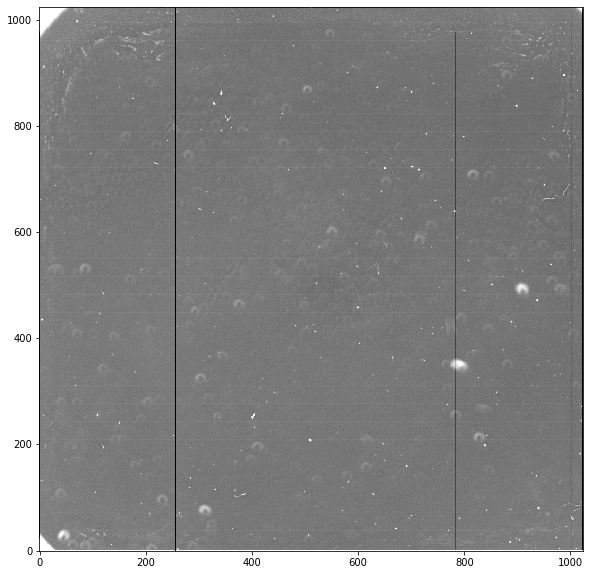

In [226]:
plt.figure(figsize=(10,10))
plt.imshow(images_all[11],origin='lower',interpolation='nearest',cmap='gray_r',vmin=15000,vmax=25000)
#plt.title("Flat Field Image, red filter")

Text(0.5, 1.0, 'Master Bias')

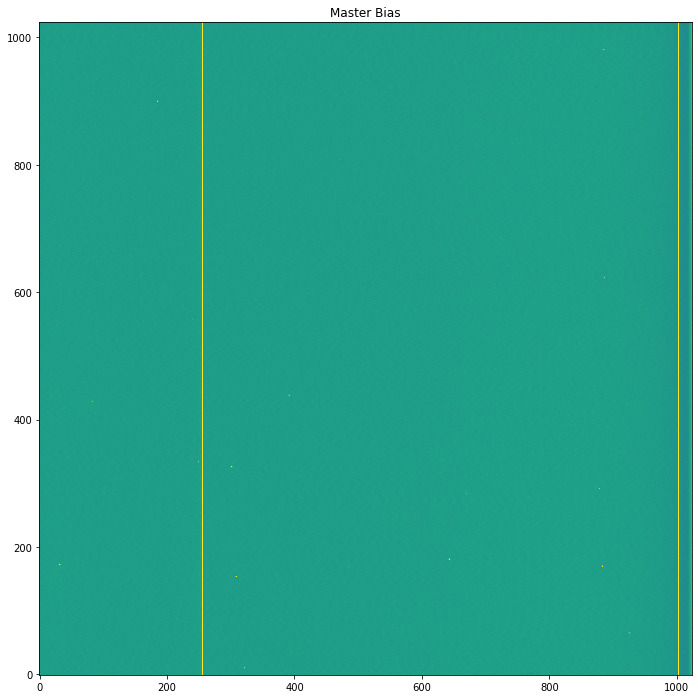

In [11]:
plt.figure(figsize=(12,12))
plt.imshow(master_bias,origin='lower',interpolation='nearest',vmin=900,vmax=1200)
plt.title("Master Bias")

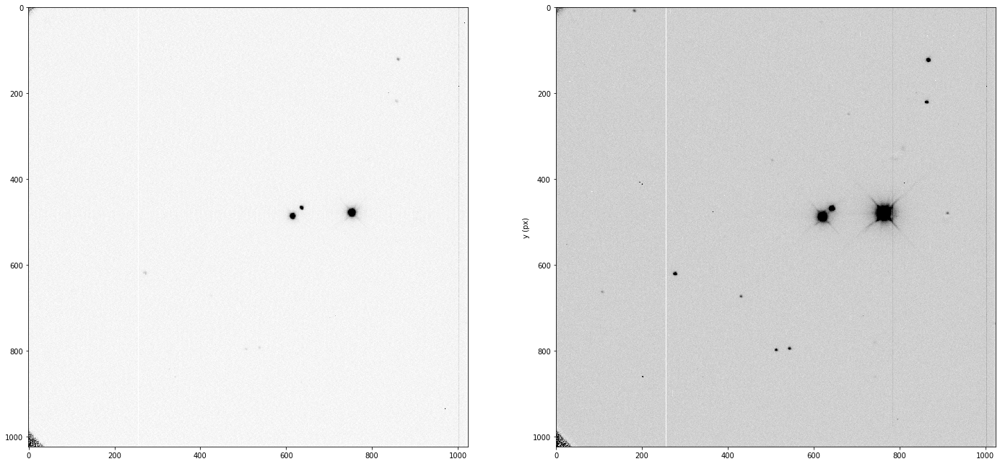

In [222]:
plt.figure(figsize=(24,12))
plt.subplot(1, 2, 1)
#plt.title("3s exposure of metis frame")
plt.imshow(images_all[82],interpolation='nearest',cmap='gray_r',vmin=0,vmax=500)

plt.subplot(1, 2, 2)
#plt.title("30s exposure")
plt.ylabel("y (px)")
plt.xlabel
plt.imshow(images_all[85],interpolation='nearest',cmap='gray_r',vmin=0,vmax=500)

In [13]:
def ToPix(coord,T,a0,d0):
    """a0 and d0 must be in astropy units, T must be in np.matrix form"""
    a = coord[0]*u.deg
    d = coord[1]*u.deg
    
    X = -1*np.cos(d)*np.sin(a-a0)/(np.cos(d0)*np.cos(d)*np.cos(a-a0)+np.sin(d)*np.sin(d0))
    Y = -1*(np.sin(d0)*np.cos(d)*np.cos(a-a0)-np.cos(d0)*np.sin(d))/(np.cos(d0)*np.cos(d)*np.cos(a-a0) + np.sin(d)*np.sin(d0))

    vector = np.matrix([[X],
                        [Y],
                        [1]])
    final = T*vector
    x = final.item(0)
    y = final.item(1)
    
    return np.array([x, y])

# Poly hour 1

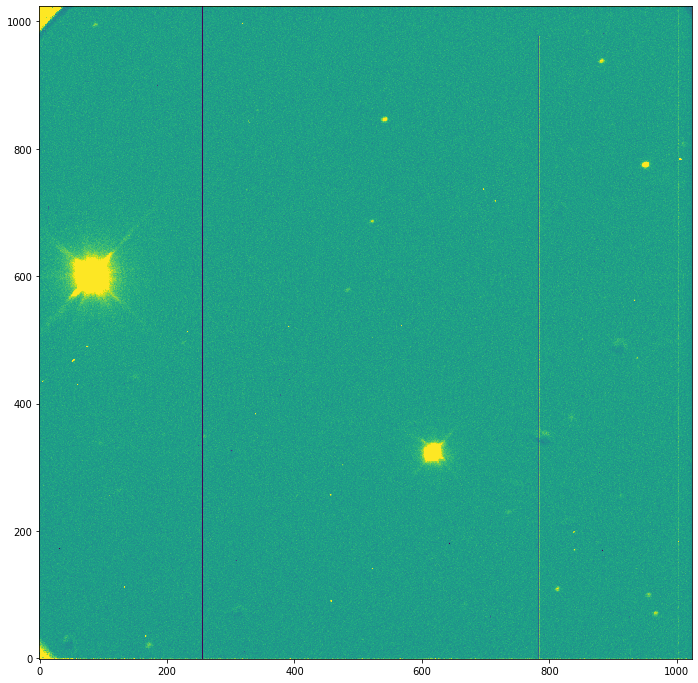

In [14]:
n10 = 24
n60 = 22

plt.figure(figsize=(12,12))
plt.imshow(images_all[n60],origin='lower',interpolation='nearest',vmin=0,vmax=400)

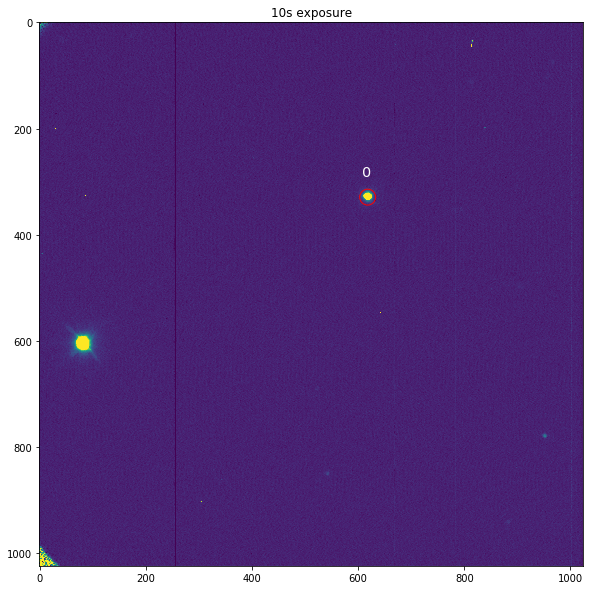

In [15]:
science_data = images_all[25]

peaks = find_star_locs(science_data, 10, 12, 1.3)


# print('index\tx\ty\n')
# for i in range(len(peaks)):
#     print('{}\t{}\t{}\t'.format(i,peaks[i][0],peaks[i][1]))
    
plt.figure(figsize=(10,10))

plt.title("{}s exposure".format(exposures[25]))
plt.imshow(science_data,interpolation='nearest',vmin=0,vmax=500)

peaks = [x for i,x in enumerate(peaks) if i in [3]]

asteroid_peak = peaks

for i in range(len(peaks)):
    plt.text(peaks[i][0]-10,peaks[i][1]-40,str(i),size='x-large',c='white',ma='center')
    fig = plt.gcf()
    ax = fig.gca()
    ax.add_artist(plt.Circle((peaks[i][0], peaks[i][1]), 15, color='r',fill=False))

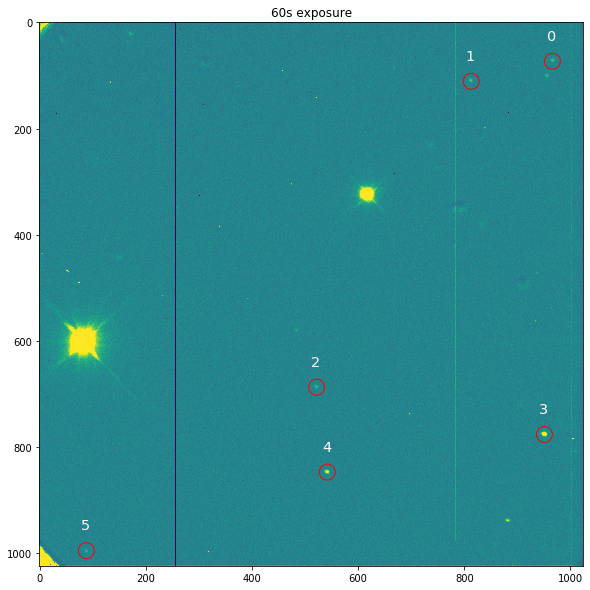

In [16]:
science_data = images_all[n60]
peaks = find_star_locs(science_data, 10, 5, 1.3)

    
plt.figure(figsize=(10,10))

plt.title("{}s exposure".format(exposures[n60]))
plt.imshow(science_data,interpolation='nearest',vmin=0,vmax=500)

peaks = [x for i,x in enumerate(peaks) if i in [1,2,7,8,10,11]]

peaks1 = peaks

for i in range(len(peaks)):
    plt.text(peaks[i][0]-10,peaks[i][1]-40,str(i),size='x-large',c='white',ma='center')
    fig = plt.gcf()
    ax = fig.gca()
    ax.add_artist(plt.Circle((peaks[i][0], peaks[i][1]), 15, color='r',fill=False))

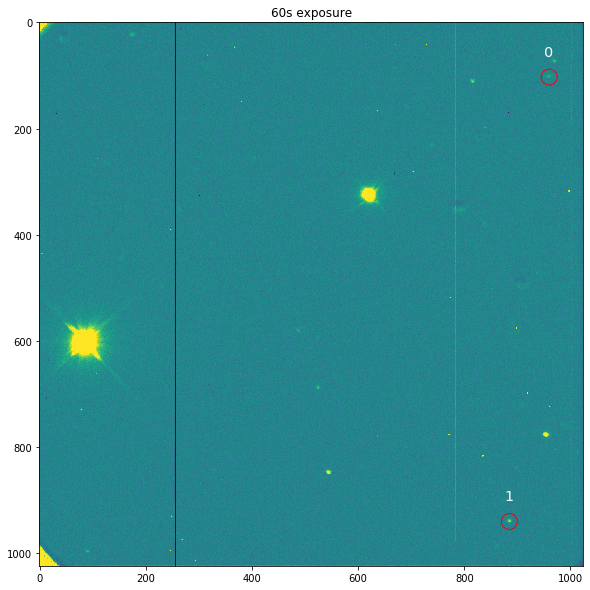

In [17]:
science_data = images_all[n60+1]
peaks = find_star_locs(images_all[n60+1], 10, 5, 1.3)


# print('index\tx\ty\n')
# for i in range(len(peaks)):
#     print('{}\t{}\t{}\t'.format(i,peaks[i][0],peaks[i][1]))
    
plt.figure(figsize=(10,10))

plt.title("{}s exposure".format(exposures[n60+1]))
plt.imshow(science_data,interpolation='nearest',vmin=0,vmax=500)

peaks = [x for i,x in enumerate(peaks) if i in [0,13]]

peaks2 = peaks

for i in range(len(peaks)):
    plt.text(peaks[i][0]-10,peaks[i][1]-40,str(i),size='x-large',c='white',ma='center')
    fig = plt.gcf()
    ax = fig.gca()
    ax.add_artist(plt.Circle((peaks[i][0], peaks[i][1]), 15, color='r',fill=False))

In [18]:
peaks1 + peaks2

[[966, 73],
 [813, 111],
 [522, 687],
 [951, 776],
 [542, 847],
 [88, 995],
 [960, 103],
 [885, 940]]

In [19]:
ident_star_locs = peaks1 + peaks2
ident_star_locs.sort()

centroids_list = calc_centroids_2d(images_all[n60], ident_star_locs)
centroids_list = np.array(centroids_list) # Convert List of list to 2D array

dataframe_header = ['Identified X','Identified Y',
                    'Centroid Xc','Uncertainity Xc','Centroid Yc','Uncertainity Yc']

# Construct a Dataframe for easily viewing the data
centroids_dataframe = pandas.DataFrame(np.hstack((ident_star_locs,centroids_list[:,0:1],
                                                 centroids_list[:,2:3], centroids_list[:,1:2],
                                                 centroids_list[:,3:4])), columns=dataframe_header)
# Display the Pandas Data Frame
centroids_dataframe

,Identified X,Identified Y,Centroid Xc,Uncertainity Xc,Centroid Yc,Uncertainity Yc
0,88.0,995.0,87.448871,0.114138,994.508972,0.117408
1,522.0,687.0,521.608188,0.107178,686.483322,0.107539
2,542.0,847.0,541.589769,0.055950,846.320348,0.057617
3,813.0,111.0,812.592184,0.097745,110.251012,0.092747
4,885.0,940.0,884.270137,0.106761,939.238368,0.112176
5,951.0,776.0,950.674598,0.016529,775.308773,0.017495
6,960.0,103.0,959.290435,0.131753,102.358706,0.139343
7,966.0,73.0,965.603637,0.107461,72.248964,0.104955


In [20]:
science_frame = data_files[n60]
hdu = fits.open(data_dir + science_frame)
science_ra_center = hdu[0].header['RA']
science_dec_center= hdu[0].header['DEC']
hdu.close()

print("RA  of science frame {}: {} (hr:mins:s)".format(science_frame, science_ra_center ))
print("Dec of science frame {}: {} degrees". format(science_frame, science_dec_center))
print("{} {}".format(science_ra_center,science_dec_center))

RA  of science frame d122.fits: 00:58:45.55 (hr:mins:s)
Dec of science frame d122.fits: 07:44:59.6 degrees
00:58:45.55 07:44:59.6


Total number of objects retrieved: 78
Column names: ['USNO-B1.0', 'RAJ2000', 'DEJ2000', 'e_RAJ2000', 'e_DEJ2000', 'Epoch', 'pmRA', 'pmDE', 'Ndet', 'B1mag', 'R1mag', 'B2mag', 'R2mag', 'Imag']


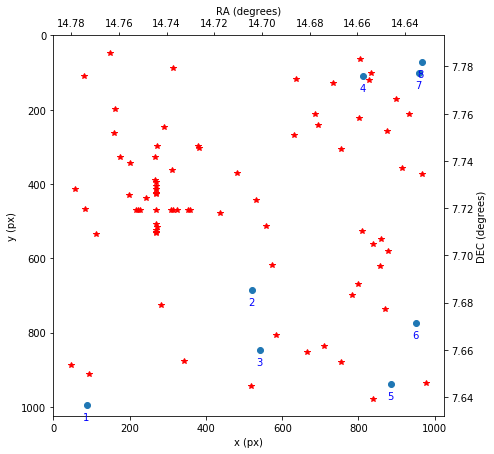

In [21]:
#ra_center = '00 58 48.182'
#dec_center = '+07 42 43.28'
ra_center = '00 58 49.182'
dec_center = '+07 42 44.28'


ra_list,dec_list = Viz_coord(centroids_list,ra_center,dec_center,20.0,'9.0m') 

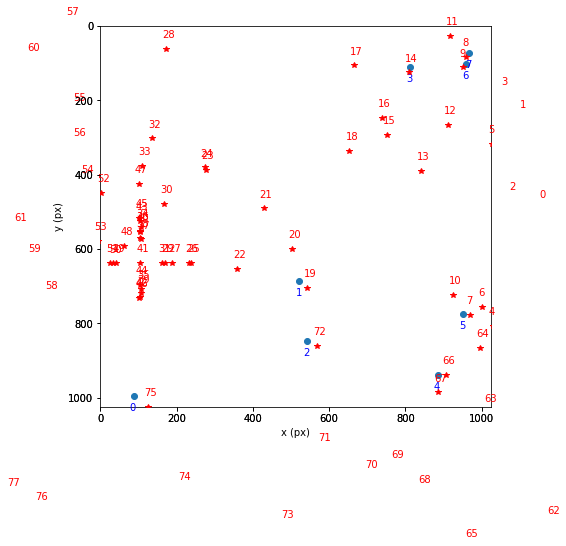

In [22]:
x_pix,y_pix = Test_initial(centroids_list,ra_list,dec_list,ra_center,dec_center,480,705)

In [23]:
ind_a,ind_b = Find_ind(centroids_list,x_pix,y_pix)

In [24]:
print(ind_a)
print(ind_b)

[0, 1, 2, 3, 4, 5, 6, 7]
[75, 19, 72, 14, 66, 7, 9, 8]


In [25]:
ra_list[ind_b]

array([14.74220995, 14.698339  , 14.695628  , 14.67023727, 14.659945  ,
       14.65350865, 14.655212  , 14.65440488])

In [26]:
test_T = Calculate_T(centroids_list[ind_a,0:2],ra_list[ind_b],dec_list[ind_b],ra_center,dec_center)

In [27]:
test_T

matrix([[ 5.57537801e+05,  1.91378481e+04,  4.57959635e+02],
        [ 2.07167481e+04, -5.56187733e+05,  6.85050210e+02],
        [ 0.00000000e+00,  0.00000000e+00,  1.00000000e+00]])

In [28]:
a0 = Angle(ra_center, unit = 'hourangle')
a0 = a0.to(u.deg)
d0 = Angle(dec_center,u.deg)

ref_stars = []

for i,ind in enumerate(ind_a):
    ref_stars.append(ToClst(centroids_list[ind,0:2],test_T,a0,d0))

ref_stars = np.transpose(np.array(ref_stars))

In [29]:
asteroid_peak

[[618, 329]]

In [30]:
asteroid_cent = calc_centroids_2d(images_all[25], asteroid_peak)
asteroid_cent = np.array(asteroid_cent) # Convert List of list to 2D array

asteroid_coord = ToClst(asteroid_cent[0,0:2],test_T,a0,d0)
asteroid_coord

array([14.68961374,  7.74967004])

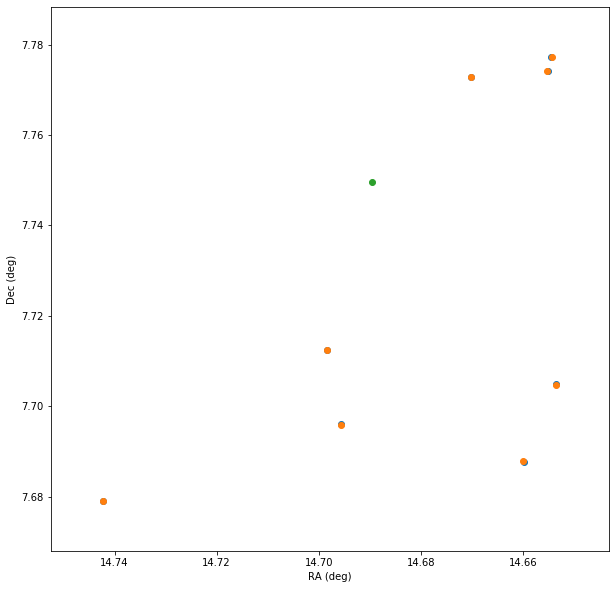

In [31]:
plt.figure(figsize=(10,10))
plt.scatter(ref_stars[0],ref_stars[1])
plt.scatter(ra_list[ind_b],dec_list[ind_b])
plt.scatter(asteroid_coord[0],asteroid_coord[1])
plt.xlabel("RA (deg)")
plt.ylabel("Dec (deg)")

plt.gca().invert_xaxis()
#plt.xlim(14.76,14.65)
#plt.ylim(7.700,7.720)

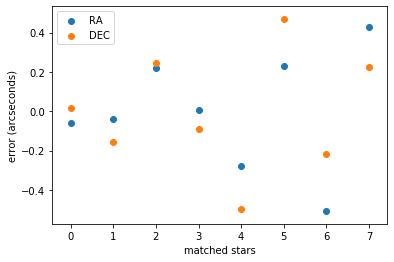

In [32]:
plt.scatter(range(len(ref_stars[0])),(ref_stars[0] - ra_list[ind_b])*3600,label='RA')
plt.scatter(range(len(ref_stars[0])),(ref_stars[1] - dec_list[ind_b])*3600,label='DEC')
plt.ylabel("error (arcseconds)")
plt.xlabel("matched stars")
plt.legend()
#plt.ylim(-0.0005,0.0005)

In [33]:
poly_ref_stars_hr1 = ref_stars
poly_ra_hr1 = ra_list[ind_b]
poly_dec_hr1 = dec_list[ind_b]
T_poly_hr1 = test_T
poly_peak_hr1 = asteroid_peak
poly_coord_hr1 = asteroid_coord

# Refined Specimen (Poly hour 2)

In [34]:
exp10 = [45,46,47]
exp60 = [48,49,50]

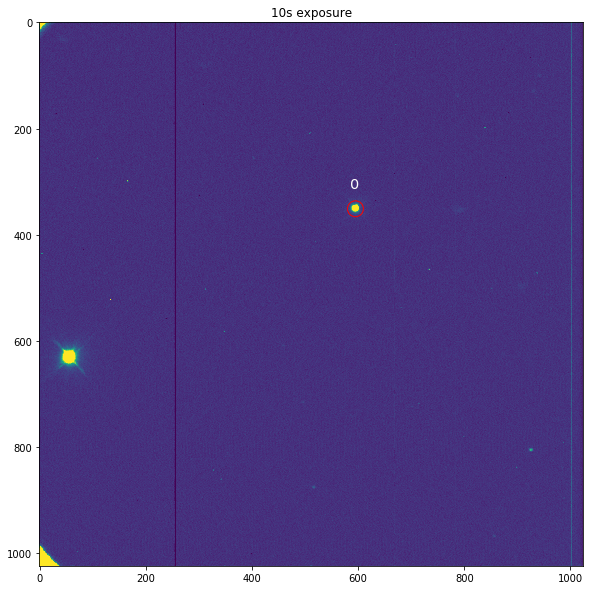

In [35]:
science_data = images_all[exp10[1]]

peaks = find_star_locs(science_data, 10, 12, 1.3)
    
plt.figure(figsize=(10,10))

plt.title("{}s exposure".format(exposures[exp10[0]]))
plt.imshow(science_data,interpolation='nearest',vmin=0,vmax=500)

peaks = [x for i,x in enumerate(peaks) if i in [0]]

asteroid_peak = peaks

for i in range(len(peaks)):
    plt.text(peaks[i][0]-10,peaks[i][1]-40,str(i),size='x-large',c='white',ma='center')
    fig = plt.gcf()
    ax = fig.gca()
    ax.add_artist(plt.Circle((peaks[i][0], peaks[i][1]), 15, color='r',fill=False))

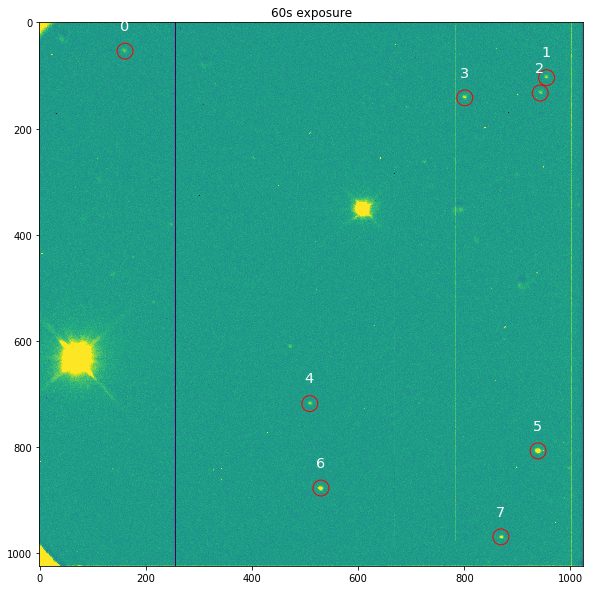

In [36]:
science_data = images_all[exp60[1]]
peaks = find_star_locs(science_data, 10, 5, 1.3)

    
plt.figure(figsize=(10,10))

plt.title("{}s exposure".format(exposures[exp60[0]]))
plt.imshow(science_data,interpolation='nearest',vmin=0,vmax=400)

peaks = [x for i,x in enumerate(peaks) if i in [0,1,2,4,11,12,13,15]]

peaks1 = peaks

for i in range(len(peaks)):
    plt.text(peaks[i][0]-10,peaks[i][1]-40,str(i),size='x-large',c='white',ma='center')
    fig = plt.gcf()
    ax = fig.gca()
    ax.add_artist(plt.Circle((peaks[i][0], peaks[i][1]), 15, color='r',fill=False))

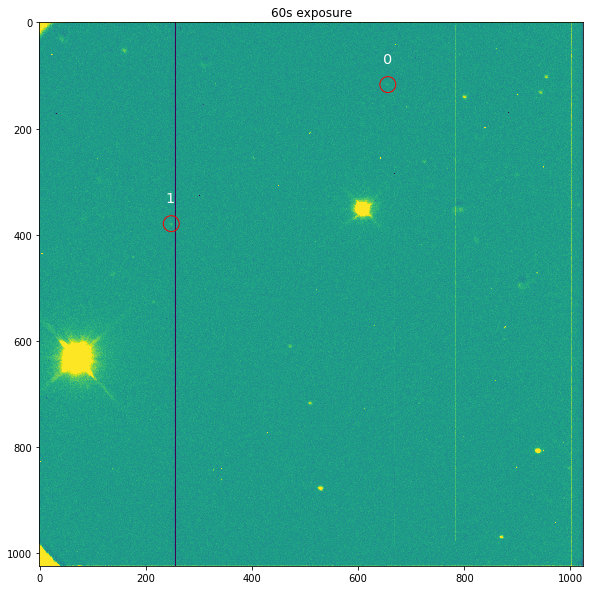

In [37]:
science_data = images_all[exp60[1]]
peaks = find_star_locs(science_data, 10, 1, 1.16,1)
    
plt.figure(figsize=(10,10))

plt.title("{}s exposure".format(exposures[exp60[2]]))
plt.imshow(science_data,interpolation='nearest',vmin=0,vmax=400)

peaks = [x for i,x in enumerate(peaks) if i in [24,81]]

peaks2 = peaks

for i in range(len(peaks)):
    plt.text(peaks[i][0]-10,peaks[i][1]-40,str(i),size='x-large',c='white',ma='center')
    fig = plt.gcf()
    ax = fig.gca()
    ax.add_artist(plt.Circle((peaks[i][0], peaks[i][1]), 15, color='r',fill=False))

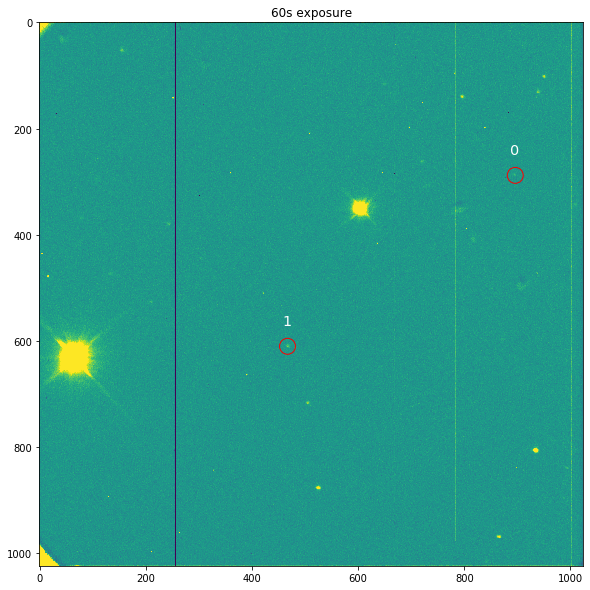

In [38]:
science_data = images_all[exp60[0]]
peaks = find_star_locs(science_data, 10, 3, 1.16,1)
    
plt.figure(figsize=(10,10))

plt.title("{}s exposure".format(exposures[exp60[2]]))
plt.imshow(science_data,interpolation='nearest',vmin=0,vmax=400)

peaks = [x for i,x in enumerate(peaks) if i in [109,24]]

peaks3 = peaks

for i in range(len(peaks)):
    plt.text(peaks[i][0]-10,peaks[i][1]-40,str(i),size='x-large',c='white',ma='center')
    fig = plt.gcf()
    ax = fig.gca()
    ax.add_artist(plt.Circle((peaks[i][0], peaks[i][1]), 15, color='r',fill=False))

In [39]:
ident_star_locs = peaks1 + peaks2 + peaks3
ident_star_locs.sort()

science_data = images_all[exp60[1]]
science_frame = data_files[exp60[1]]


temp = calc_centroids_2d(science_data, ident_star_locs)
temp = np.array(temp) # Convert List of list to 2D array
poly_cent_hr2 = temp
centroids = temp

dataframe_header = ['Identified X','Identified Y',
                    'Centroid Xc','Uncertainity Xc','Centroid Yc','Uncertainity Yc']

# Construct a Dataframe for easily viewing the data
centroids_dataframe = pandas.DataFrame(np.hstack((ident_star_locs,centroids[:,0:1],
                                                 centroids[:,2:3], centroids[:,1:2],
                                                 centroids[:,3:4])), columns=dataframe_header)
# Display the Pandas Data Frame
centroids_dataframe

,Identified X,Identified Y,Centroid Xc,Uncertainity Xc,Centroid Yc,Uncertainity Yc
0,161.0,54.0,160.551472,0.113617,53.414745,0.114334
1,248.0,379.0,247.071566,0.123569,378.563767,0.135357
2,467.0,610.0,467.198075,0.130656,609.601810,0.145379
3,509.0,718.0,508.731167,0.108874,717.396883,0.107362
4,530.0,877.0,529.527515,0.053817,876.825900,0.056703
5,656.0,117.0,655.352258,0.138826,116.527859,0.139562
6,801.0,142.0,800.556460,0.095894,141.394695,0.094635
7,869.0,969.0,868.946326,0.079225,968.650265,0.083834
8,896.0,288.0,895.815794,0.139386,287.404094,0.145145
9,939.0,807.0,938.664616,0.015693,806.510374,0.015693


In [40]:
hdu = fits.open(data_dir + science_frame)
science_ra_center = hdu[0].header['RA']
science_dec_center= hdu[0].header['DEC']
hdu.close()

print("RA  of science frame {}: {} (hr:mins:s)".format(science_frame, science_ra_center ))
print("Dec of science frame {}: {} degrees". format(science_frame, science_dec_center))
print("{} {}".format(science_ra_center,science_dec_center))

RA  of science frame d149.fits: 00:58:45.53 (hr:mins:s)
Dec of science frame d149.fits: 07:44:59.6 degrees
00:58:45.53 07:44:59.6


Total number of objects retrieved: 126
Column names: ['USNO-B1.0', 'RAJ2000', 'DEJ2000', 'e_RAJ2000', 'e_DEJ2000', 'Epoch', 'pmRA', 'pmDE', 'Ndet', 'B1mag', 'R1mag', 'B2mag', 'R2mag', 'Imag']


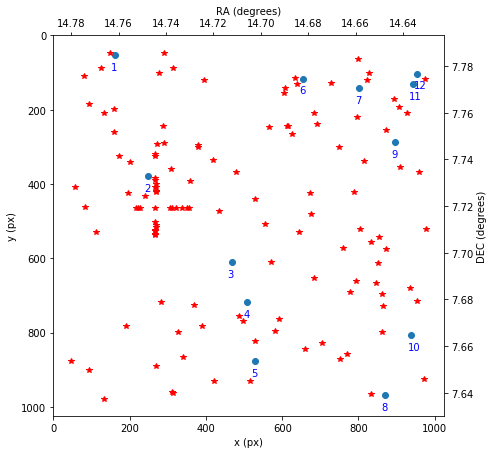

In [41]:
#ra_center = '00 58 48.182'
#dec_center = '+07 42 43.28'
ra_center = '00 58 49.182'
dec_center = '+07 42 44.28'

ra_list,dec_list = Viz_coord(centroids,ra_center,dec_center,22.0,'9.0m') 

[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[47, 41, 35, 34, 108, 26, 20, 99, 16, 10, 12, 11]


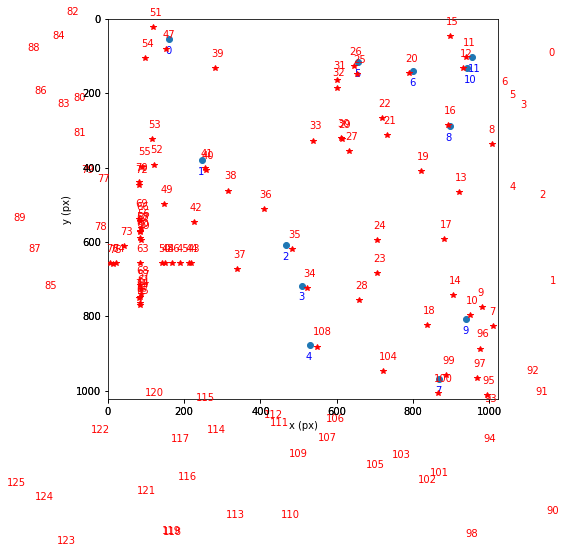

In [42]:
x_pix,y_pix = Test_initial(centroids,ra_list,dec_list,ra_center,dec_center,460,725)
ind_a,ind_b = Find_ind(centroids,x_pix,y_pix)
print(ind_a)
print(ind_b)

In [43]:
test_T = Calculate_T(centroids[ind_a,0:2],ra_list[ind_b],dec_list[ind_b],ra_center,dec_center)

In [44]:
a0 = Angle(ra_center, unit = 'hourangle')
a0 = a0.to(u.deg)
d0 = Angle(dec_center,u.deg)

ref_stars = []

for i,ind in enumerate(ind_a):
    ref_stars.append(ToClst(centroids[ind,0:2],test_T,a0,d0))

ref_stars = np.transpose(np.array(ref_stars))

In [45]:
asteroid_cent = calc_centroids_2d(science_data, asteroid_peak)
asteroid_cent = np.array(asteroid_cent) # Convert List of list to 2D array

asteroid_coord = ToClst(asteroid_cent[0,0:2],test_T,a0,d0)
asteroid_coord

array([14.69000302,  7.75047566])

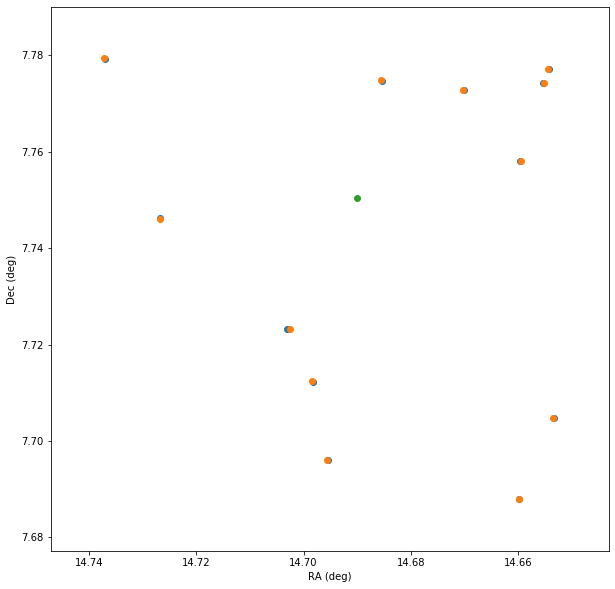

In [46]:
plt.figure(figsize=(10,10))
plt.scatter(ref_stars[0],ref_stars[1])
plt.scatter(ra_list[ind_b],dec_list[ind_b])
plt.scatter(asteroid_coord[0],asteroid_coord[1])
plt.xlabel("RA (deg)")
plt.ylabel("Dec (deg)")

plt.gca().invert_xaxis()
#plt.xlim(14.76,14.65)
#plt.ylim(7.700,7.720)

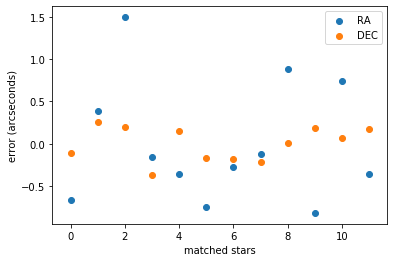

In [47]:
plt.scatter(range(len(ref_stars[0])),(ref_stars[0] - ra_list[ind_b])*3600,label='RA')
plt.scatter(range(len(ref_stars[0])),(ref_stars[1] - dec_list[ind_b])*3600,label='DEC')
plt.ylabel("error (arcseconds)")
plt.xlabel("matched stars")
plt.legend()
#plt.ylim(-0.0005,0.0005)

In [48]:
poly_ref_stars_hr2 = ref_stars
poly_ra_hr2 = ra_list[ind_b]
poly_dec_hr2 = dec_list[ind_b]
T_poly_hr2 = test_T
poly_peak_hr2 = asteroid_peak
poly_coord_hr2 = asteroid_coord

# Poly hour 3

In [49]:
exp10 = [62,63,64]
exp60 = [65,66,67]

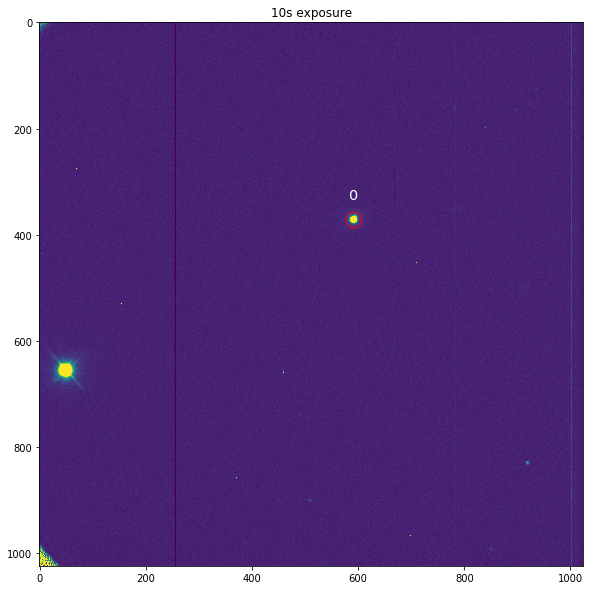

In [50]:
science_data = images_all[exp10[0]]

peaks = find_star_locs(science_data, 10, 12, 1.3)


# print('index\tx\ty\n')
# for i in range(len(peaks)):
#     print('{}\t{}\t{}\t'.format(i,peaks[i][0],peaks[i][1]))
    
plt.figure(figsize=(10,10))

plt.title("{}s exposure".format(exposures[exp10[0]]))
plt.imshow(science_data,interpolation='nearest',vmin=0,vmax=500)

peaks = [x for i,x in enumerate(peaks) if i in [0]]

asteroid_peak = peaks

for i in range(len(peaks)):
    plt.text(peaks[i][0]-10,peaks[i][1]-40,str(i),size='x-large',c='white',ma='center')
    fig = plt.gcf()
    ax = fig.gca()
    ax.add_artist(plt.Circle((peaks[i][0], peaks[i][1]), 15, color='r',fill=False))

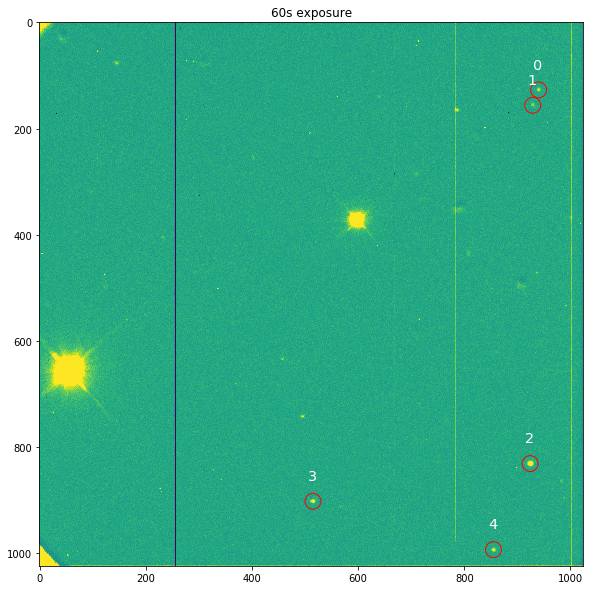

In [51]:
science_data = images_all[exp60[0]]
peaks = find_star_locs(science_data, 10, 5, 1.3)

    
plt.figure(figsize=(10,10))

plt.title("{}s exposure".format(exposures[exp60[0]]))
plt.imshow(science_data,interpolation='nearest',vmin=0,vmax=400)

peaks = [x for i,x in enumerate(peaks) if i in [0,1,12,14,15]]

peaks1 = peaks

for i in range(len(peaks)):
    plt.text(peaks[i][0]-10,peaks[i][1]-40,str(i),size='x-large',c='white',ma='center')
    fig = plt.gcf()
    ax = fig.gca()
    ax.add_artist(plt.Circle((peaks[i][0], peaks[i][1]), 15, color='r',fill=False))

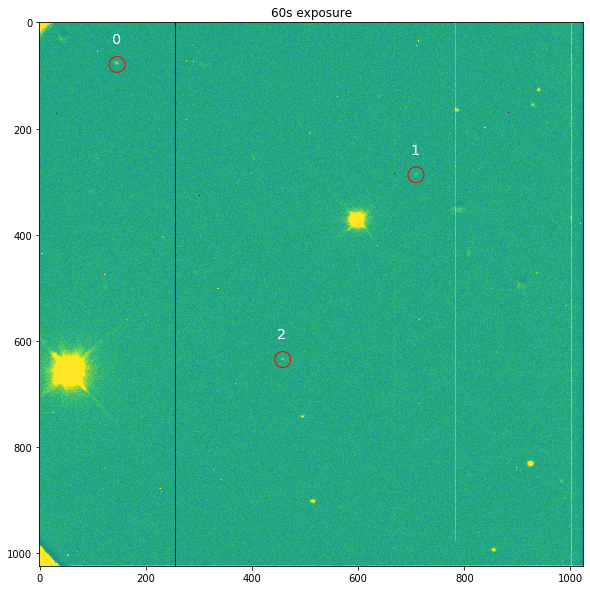

In [52]:
science_data = images_all[exp60[0]]
peaks = find_star_locs(science_data, 10, 5, 1.2,1)
    
plt.figure(figsize=(10,10))

plt.title("{}s exposure".format(exposures[exp60[2]]))
plt.imshow(science_data,interpolation='nearest',vmin=0,vmax=400)

peaks = [x for i,x in enumerate(peaks) if i in [6,18,69]]

peaks2 = peaks

for i in range(len(peaks)):
    plt.text(peaks[i][0]-10,peaks[i][1]-40,str(i),size='x-large',c='white',ma='center')
    fig = plt.gcf()
    ax = fig.gca()
    ax.add_artist(plt.Circle((peaks[i][0], peaks[i][1]), 15, color='r',fill=False))

In [53]:
peaks1 + peaks2

[[940, 127],
 [929, 156],
 [924, 831],
 [515, 902],
 [855, 993],
 [146, 79],
 [709, 287],
 [458, 635]]

In [54]:
ident_star_locs = peaks1 + peaks2
ident_star_locs.sort()

science_data = images_all[exp60[0]]
science_frame = data_files[exp60[0]]


temp = calc_centroids_2d(science_data, ident_star_locs)
temp = np.array(temp) # Convert List of list to 2D array
poly_cent_hr3 = temp
centroids = temp

dataframe_header = ['Identified X','Identified Y',
                    'Centroid Xc','Uncertainity Xc','Centroid Yc','Uncertainity Yc']

# Construct a Dataframe for easily viewing the data
centroids_dataframe = pandas.DataFrame(np.hstack((ident_star_locs,centroids[:,0:1],
                                                 centroids[:,2:3], centroids[:,1:2],
                                                 centroids[:,3:4])), columns=dataframe_header)
# Display the Pandas Data Frame
centroids_dataframe

,Identified X,Identified Y,Centroid Xc,Uncertainity Xc,Centroid Yc,Uncertainity Yc
0,146.0,79.0,145.608128,0.114357,78.182985,0.110362
1,458.0,635.0,457.676745,0.112337,634.424161,0.114932
2,515.0,902.0,514.795274,0.050147,901.461726,0.051149
3,709.0,287.0,708.598545,0.122044,286.428060,0.120959
4,855.0,993.0,854.801847,0.071087,992.581130,0.077460
5,924.0,831.0,924.049965,0.014220,830.486533,0.016445
6,929.0,156.0,928.557772,0.105900,155.549183,0.107445
7,940.0,127.0,939.664964,0.097445,126.505868,0.097731


In [55]:
hdu = fits.open(data_dir + science_frame)
science_ra_center = hdu[0].header['RA']
science_dec_center= hdu[0].header['DEC']
hdu.close()

print("RA  of science frame {}: {} (hr:mins:s)".format(science_frame, science_ra_center ))
print("Dec of science frame {}: {} degrees". format(science_frame, science_dec_center))
print("{} {}".format(science_ra_center,science_dec_center))

RA  of science frame d165.fits: 00:58:45.50 (hr:mins:s)
Dec of science frame d165.fits: 07:45:00.0 degrees
00:58:45.50 07:45:00.0


Total number of objects retrieved: 78
Column names: ['USNO-B1.0', 'RAJ2000', 'DEJ2000', 'e_RAJ2000', 'e_DEJ2000', 'Epoch', 'pmRA', 'pmDE', 'Ndet', 'B1mag', 'R1mag', 'B2mag', 'R2mag', 'Imag']


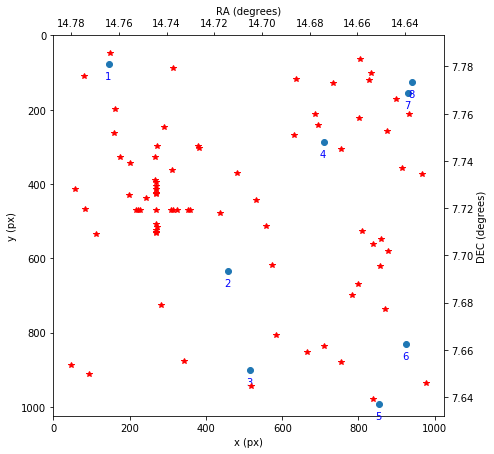

In [56]:
#ra_center = '00 58 48.182'
#dec_center = '+07 42 43.28'
ra_center = '00 58 49.182'
dec_center = '+07 42 44.28'

ra_list,dec_list = Viz_coord(centroids,ra_center,dec_center,20.0,'9.0m') 

[0, 1, 2, 3, 4, 5, 6, 7]
[28, 20, 72, 16, 66, 7, 9, 8]


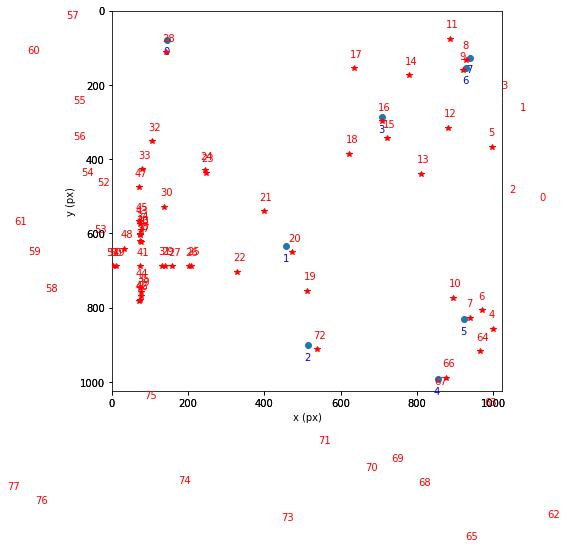

In [57]:
x_pix,y_pix = Test_initial(centroids,ra_list,dec_list,ra_center,dec_center,450,755)
ind_a,ind_b = Find_ind(centroids,x_pix,y_pix)
print(ind_a)
print(ind_b)

In [58]:
test_T = Calculate_T(centroids[ind_a,0:2],ra_list[ind_b],dec_list[ind_b],ra_center,dec_center)
#test_T = T_poly_hr1

In [59]:
a0 = Angle(ra_center, unit = 'hourangle')
a0 = a0.to(u.deg)
d0 = Angle(dec_center,u.deg)

ref_stars = []

for i,ind in enumerate(ind_a):
    ref_stars.append(ToClst(centroids[ind,0:2],test_T,a0,d0))

ref_stars = np.transpose(np.array(ref_stars))

In [60]:
asteroid_cent = calc_centroids_2d(science_data, asteroid_peak)
asteroid_cent = np.array(asteroid_cent) # Convert List of list to 2D array

asteroid_coord = ToClst(asteroid_cent[0,0:2],test_T,a0,d0)
asteroid_coord

array([14.68908315,  7.75074755])

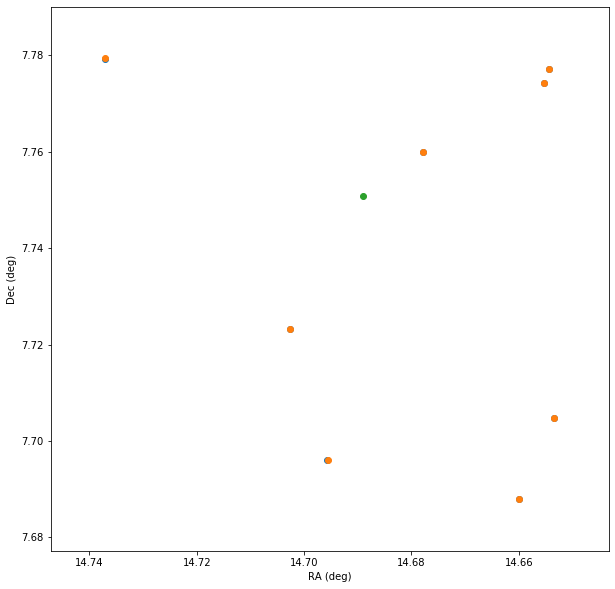

In [61]:
plt.figure(figsize=(10,10))
plt.scatter(ref_stars[0],ref_stars[1])
plt.scatter(ra_list[ind_b],dec_list[ind_b])
plt.scatter(asteroid_coord[0],asteroid_coord[1])
plt.xlabel("RA (deg)")
plt.ylabel("Dec (deg)")

plt.gca().invert_xaxis()
#plt.xlim(14.76,14.65)
#plt.ylim(7.700,7.720)

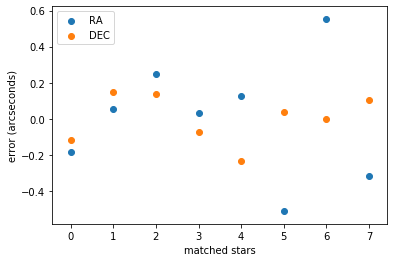

In [62]:
plt.scatter(range(len(ref_stars[0])),(ref_stars[0] - ra_list[ind_b])*3600,label='RA')
plt.scatter(range(len(ref_stars[0])),(ref_stars[1] - dec_list[ind_b])*3600,label='DEC')
plt.ylabel("error (arcseconds)")
plt.xlabel("matched stars")
plt.legend()
#plt.ylim(-0.0005,0.0005)

In [63]:
poly_ref_stars_hr3 = ref_stars
poly_ra_hr3 = ra_list[ind_b]
poly_dec_hr3 = dec_list[ind_b]
T_poly_hr3 = test_T
poly_peak_hr3 = asteroid_peak
poly_coord_hr3 = asteroid_coord

# Poly hour 4

In [64]:
exp10 = [86,87,88]
exp60 = [89,90,91]

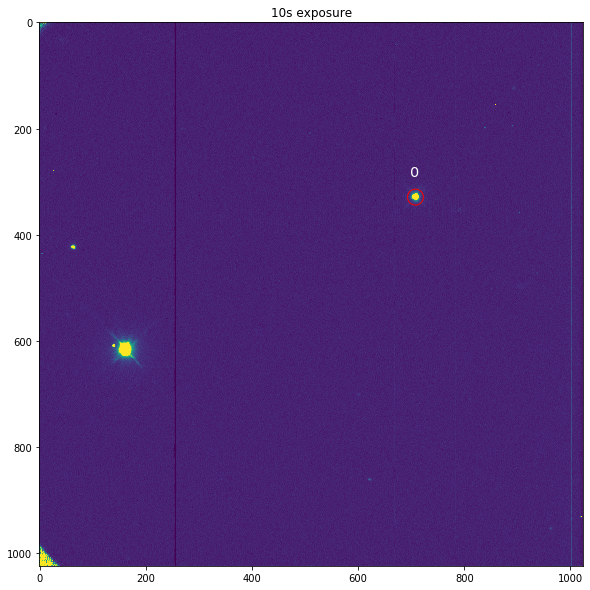

In [65]:
science_data = images_all[exp10[2]]
asteroid_data = science_data

peaks = find_star_locs(science_data, 10, 12, 1.3)


# print('index\tx\ty\n')
# for i in range(len(peaks)):
#     print('{}\t{}\t{}\t'.format(i,peaks[i][0],peaks[i][1]))
    
plt.figure(figsize=(10,10))

plt.title("{}s exposure".format(exposures[exp10[0]]))
plt.imshow(science_data,interpolation='nearest',vmin=0,vmax=500)

peaks = [x for i,x in enumerate(peaks) if i in [1]]

asteroid_peak = peaks

for i in range(len(peaks)):
    plt.text(peaks[i][0]-10,peaks[i][1]-40,str(i),size='x-large',c='white',ma='center')
    fig = plt.gcf()
    ax = fig.gca()
    ax.add_artist(plt.Circle((peaks[i][0], peaks[i][1]), 15, color='r',fill=False))

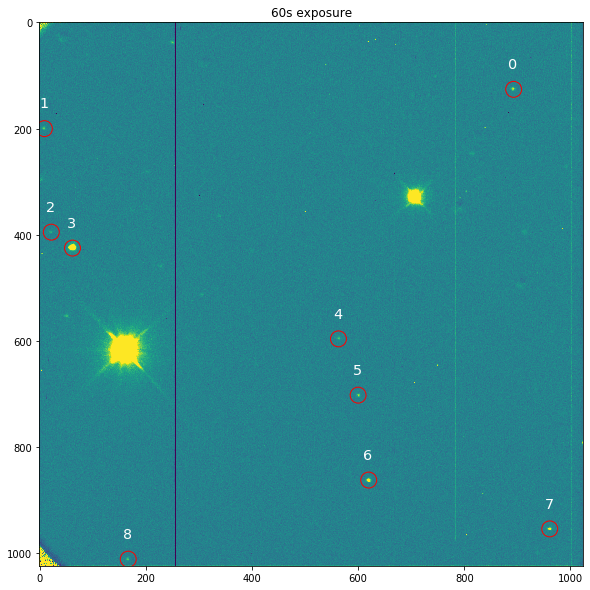

In [66]:
science_data = images_all[exp60[1]]
peaks = find_star_locs(science_data, 10, 5, 1.3)


# print('index\tx\ty\n')
# for i in range(len(peaks)):
#     print('{}\t{}\t{}\t'.format(i,peaks[i][0],peaks[i][1]))
    
plt.figure(figsize=(10,10))

plt.title("{}s exposure".format(exposures[exp60[1]]))
plt.imshow(science_data,interpolation='nearest',vmin=0,vmax=400)

peaks = [x for i,x in enumerate(peaks) if i in [1,3,8,9,12,25,27,29,28]]

peaks1 = peaks

for i in range(len(peaks)):
    plt.text(peaks[i][0]-10,peaks[i][1]-40,str(i),size='x-large',c='white',ma='center')
    fig = plt.gcf()
    ax = fig.gca()
    ax.add_artist(plt.Circle((peaks[i][0], peaks[i][1]), 15, color='r',fill=False))

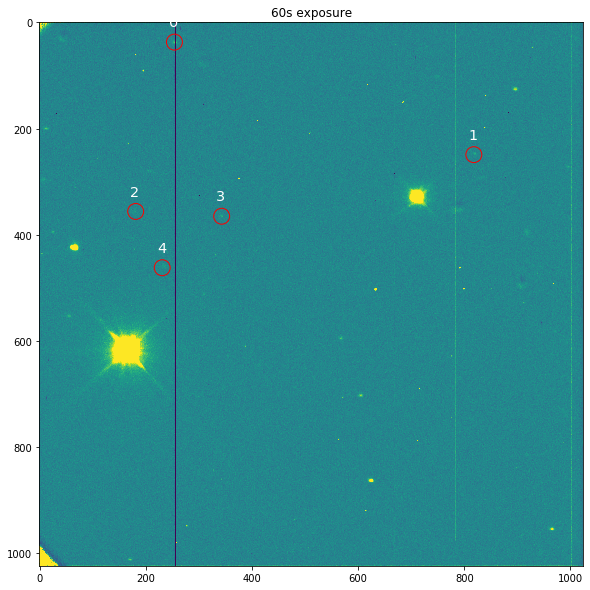

In [67]:
science_data = images_all[exp60[2]]
peaks = find_star_locs(science_data, 10, 5, 1.2,1)


# print('index\tx\ty\n')
# for i in range(len(peaks)):
#     print('{}\t{}\t{}\t'.format(i,peaks[i][0],peaks[i][1]))
    
plt.figure(figsize=(10,10))

plt.title("{}s exposure".format(exposures[exp60[1]]))
plt.imshow(science_data,interpolation='nearest',vmin=0,vmax=400)

peaks = [x for i,x in enumerate(peaks) if i in [2,14,42,53,46]]

peaks2 = peaks

for i in range(len(peaks)):
    plt.text(peaks[i][0]-10,peaks[i][1]-30,str(i),size='x-large',c='white',ma='center')
    fig = plt.gcf()
    ax = fig.gca()
    ax.add_artist(plt.Circle((peaks[i][0], peaks[i][1]), 15, color='r',fill=False))

In [68]:
ident_star_locs = peaks1 + peaks2
ident_star_locs.sort()

science_data = images_all[exp60[0]]
science_frame = data_files[exp60[0]]


temp = calc_centroids_2d(science_data, ident_star_locs)
temp = np.array(temp) # Convert List of list to 2D array
poly_cent_hr4 = temp
centroids = temp

dataframe_header = ['Identified X','Identified Y',
                    'Centroid Xc','Uncertainity Xc','Centroid Yc','Uncertainity Yc']

# Construct a Dataframe for easily viewing the data
centroids_dataframe = pandas.DataFrame(np.hstack((ident_star_locs,centroids[:,0:1],
                                                 centroids[:,2:3], centroids[:,1:2],
                                                 centroids[:,3:4])), columns=dataframe_header)
# Display the Pandas Data Frame
centroids_dataframe

,Identified X,Identified Y,Centroid Xc,Uncertainity Xc,Centroid Yc,Uncertainity Yc
0,9.0,200.0,9.167822,0.110065,199.279732,0.129165
1,22.0,395.0,21.626843,0.149577,394.396340,0.147177
2,62.0,425.0,63.129736,0.001296,423.618419,0.001493
3,167.0,1011.0,166.623498,0.131441,1010.332012,0.128604
4,181.0,356.0,180.227049,0.186262,355.545407,0.193157
5,231.0,462.0,230.373324,0.180470,461.423966,0.173130
6,254.0,37.0,253.162145,0.136727,36.443111,0.147514
7,343.0,365.0,342.244080,0.162527,364.550319,0.188085
8,563.0,596.0,562.803194,0.151607,595.276026,0.146852
9,600.0,702.0,600.058582,0.116812,701.582514,0.138770


In [69]:
hdu = fits.open(data_dir + science_frame)
science_ra_center = hdu[0].header['RA']
science_dec_center= hdu[0].header['DEC']
hdu.close()

print("RA  of science frame {}: {} (hr:mins:s)".format(science_frame, science_ra_center ))
print("Dec of science frame {}: {} degrees". format(science_frame, science_dec_center))
print("{} {}".format(science_ra_center,science_dec_center))

RA  of science frame d189.fits: 00:58:45.48 (hr:mins:s)
Dec of science frame d189.fits: 07:45:00.0 degrees
00:58:45.48 07:45:00.0


Total number of objects retrieved: 78
Column names: ['USNO-B1.0', 'RAJ2000', 'DEJ2000', 'e_RAJ2000', 'e_DEJ2000', 'Epoch', 'pmRA', 'pmDE', 'Ndet', 'B1mag', 'R1mag', 'B2mag', 'R2mag', 'Imag']


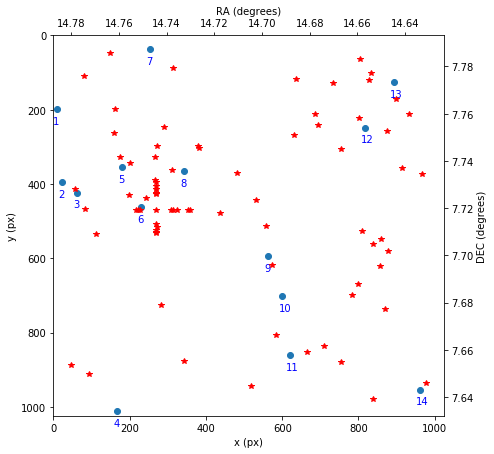

In [70]:
#ra_center = '00 58 48.182'
#dec_center = '+07 42 43.28'
ra_center = '00 58 49.182'
dec_center = '+07 42 44.28'

ra_list,dec_list = Viz_coord(centroids,ra_center,dec_center,20.0,'9.0m') 

[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13]
[55, 54, 52, 75, 33, 30, 28, 24, 20, 19, 72, 16, 14, 66]


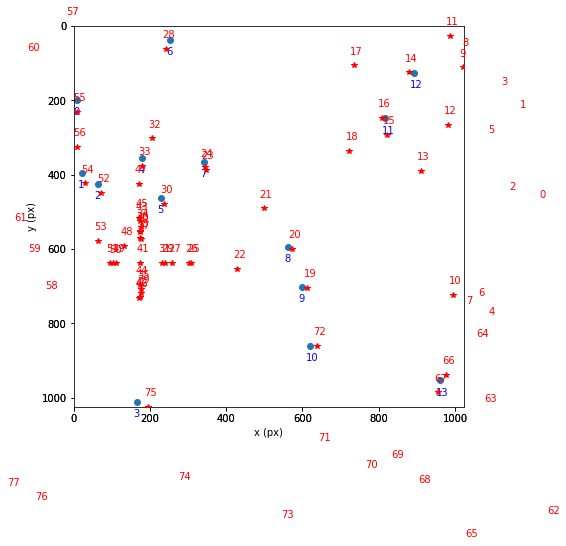

In [71]:
x_pix,y_pix = Test_initial(centroids,ra_list,dec_list,ra_center,dec_center,550,705)
ind_a,ind_b = Find_ind(centroids,x_pix,y_pix)
print(ind_a)
print(ind_b)

In [72]:
test_T = Calculate_T(centroids[ind_a,0:2],ra_list[ind_b],dec_list[ind_b],ra_center,dec_center)
#test_T = T_poly_hr1

In [73]:
a0 = Angle(ra_center, unit = 'hourangle')
a0 = a0.to(u.deg)
d0 = Angle(dec_center,u.deg)

ref_stars = []

for i,ind in enumerate(ind_a):
    ref_stars.append(ToClst(centroids[ind,0:2],test_T,a0,d0))

ref_stars = np.transpose(np.array(ref_stars))

In [74]:
asteroid_cent = calc_centroids_2d(asteroid_data, asteroid_peak)
asteroid_cent = np.array(asteroid_cent) # Convert List of list to 2D array

asteroid_coord = ToClst(asteroid_cent[0,0:2],test_T,a0,d0)
asteroid_coord

array([14.68871867,  7.75120844])

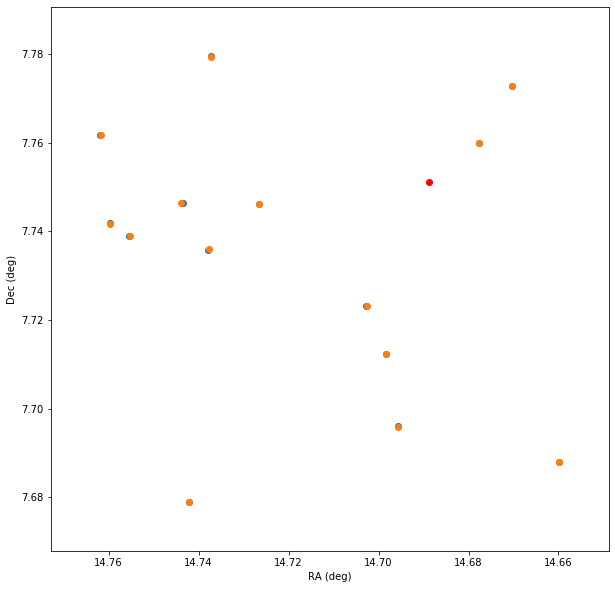

In [75]:
plt.figure(figsize=(10,10))
plt.scatter(ref_stars[0],ref_stars[1])
plt.scatter(ra_list[ind_b],dec_list[ind_b])
plt.scatter(asteroid_coord[0],asteroid_coord[1],c='r')
plt.xlabel("RA (deg)")
plt.ylabel("Dec (deg)")

plt.gca().invert_xaxis()
#plt.xlim(14.76,14.65)
#plt.ylim(7.700,7.720)

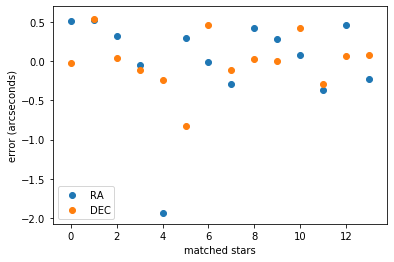

In [76]:
plt.scatter(range(len(ref_stars[0])),(ref_stars[0] - ra_list[ind_b])*3600,label='RA')
plt.scatter(range(len(ref_stars[0])),(ref_stars[1] - dec_list[ind_b])*3600,label='DEC')
plt.ylabel("error (arcseconds)")
plt.xlabel("matched stars")
plt.legend()
#plt.ylim(-0.0005,0.0005)

In [77]:
poly_ref_stars_hr4 = ref_stars
poly_ra_hr4 = ra_list[ind_b]
poly_dec_hr4 = dec_list[ind_b]
T_poly_hr4 = test_T
poly_peak_hr4 = asteroid_peak
poly_coord_hr4 = asteroid_coord

# Metis hour 1

In [78]:
exp3 = [30,31,32,33,34]
exp30 = [36,37,38]

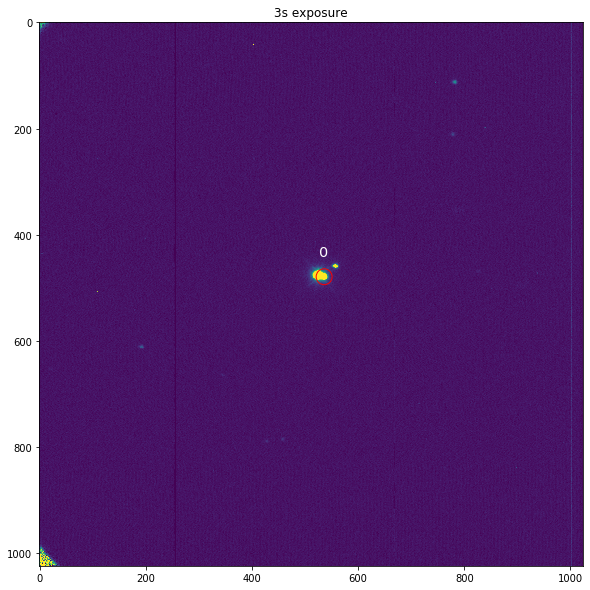

In [79]:
science_data = images_all[exp3[4]]
asteroid_data = science_data

peaks = find_star_locs(science_data, 10, 12, 1.5)


# print('index\tx\ty\n')
# for i in range(len(peaks)):
#     print('{}\t{}\t{}\t'.format(i,peaks[i][0],peaks[i][1]))
    
plt.figure(figsize=(10,10))

plt.title("{}s exposure".format(exposures[exp3[0]]))
plt.imshow(science_data,interpolation='nearest',vmin=0,vmax=500)

peaks = [x for i,x in enumerate(peaks) if i in [6]]

asteroid_peak = peaks

for i in range(len(peaks)):
    plt.text(peaks[i][0]-10,peaks[i][1]-40,str(i),size='x-large',c='white',ma='center')
    fig = plt.gcf()
    ax = fig.gca()
    ax.add_artist(plt.Circle((peaks[i][0], peaks[i][1]), 15, color='r',fill=False))

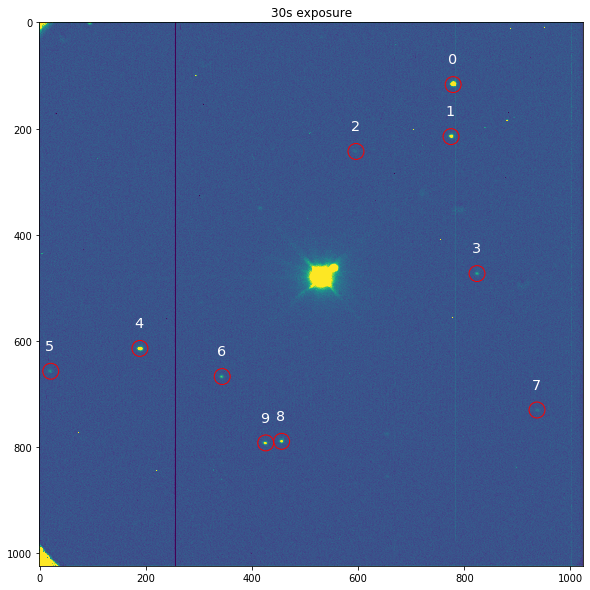

In [80]:
science_data = images_all[exp30[2]]
peaks = find_star_locs(science_data, 10, 10, 1.3,1)


# print('index\tx\ty\n')
# for i in range(len(peaks)):
#     print('{}\t{}\t{}\t'.format(i,peaks[i][0],peaks[i][1]))
    
plt.figure(figsize=(10,10))

plt.title("{}s exposure".format(exposures[exp30[1]]))
plt.imshow(science_data,interpolation='nearest',vmin=0,vmax=500)

peaks = [x for i,x in enumerate(peaks) if i in [4,6,9,27,53,55,54,52,50,51]]

peaks1 = peaks

for i in range(len(peaks)):
    plt.text(peaks[i][0]-10,peaks[i][1]-40,str(i),size='x-large',c='white',ma='center')
    fig = plt.gcf()
    ax = fig.gca()
    ax.add_artist(plt.Circle((peaks[i][0], peaks[i][1]), 15, color='r',fill=False))

In [81]:
ident_star_locs = peaks1
ident_star_locs.sort()

science_data = images_all[exp30[2]]
science_frame = data_files[exp30[2]]


metis_cent_hr1 = calc_centroids_2d(science_data, ident_star_locs)
metis_cent_hr1 = np.array(metis_cent_hr1) # Convert List of list to 2D array
centroids = metis_cent_hr1

dataframe_header = ['Identified X','Identified Y',
                    'Centroid Xc','Uncertainity Xc','Centroid Yc','Uncertainity Yc']

# Construct a Dataframe for easily viewing the data
centroids_dataframe = pandas.DataFrame(np.hstack((ident_star_locs,centroids[:,0:1],
                                                 centroids[:,2:3], centroids[:,1:2],
                                                 centroids[:,3:4])), columns=dataframe_header)
# Display the Pandas Data Frame
centroids_dataframe

,Identified X,Identified Y,Centroid Xc,Uncertainity Xc,Centroid Yc,Uncertainity Yc
0,21.0,657.0,20.485489,0.148056,656.476895,0.155809
1,189.0,614.0,189.422857,0.014529,613.988820,0.015538
2,344.0,667.0,343.424732,0.092500,666.676955,0.104600
3,426.0,792.0,425.427203,0.044268,791.793139,0.053094
4,456.0,789.0,455.749238,0.047100,788.556077,0.048245
5,596.0,243.0,595.479924,0.198453,242.492158,0.210659
6,775.0,215.0,775.173368,0.026262,214.345922,0.026831
7,779.0,117.0,779.012161,0.008157,116.254583,0.007356
8,824.0,473.0,823.630436,0.110912,472.626963,0.120395
9,937.0,730.0,936.800786,0.165772,729.712225,0.182068


In [82]:
hdu = fits.open(data_dir + science_frame)
science_ra_center = hdu[0].header['RA']
science_dec_center= hdu[0].header['DEC']
hdu.close()

print("RA  of science frame {}: {} (hr:mins:s)".format(science_frame, science_ra_center ))
print("Dec of science frame {}: {} degrees". format(science_frame, science_dec_center))
print("{} {}".format(science_ra_center,science_dec_center))

RA  of science frame d138.fits: 01:45:24.50 (hr:mins:s)
Dec of science frame d138.fits: 05:49:20.5 degrees
01:45:24.50 05:49:20.5


Total number of objects retrieved: 31
Column names: ['USNO-B1.0', 'RAJ2000', 'DEJ2000', 'e_RAJ2000', 'e_DEJ2000', 'Epoch', 'pmRA', 'pmDE', 'Ndet', 'B1mag', 'R1mag', 'B2mag', 'R2mag', 'Imag']


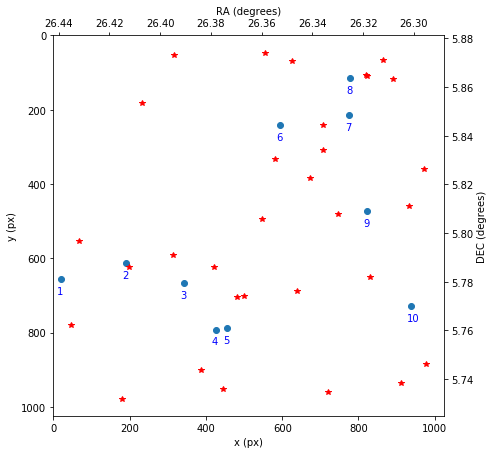

In [83]:
ra_center = '01 45 26.394'
dec_center = '+05 48 15.76'

ra_list,dec_list = Viz_coord(centroids,ra_center,dec_center,18.0,'9.0m') 

[0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
[27, 26, 24, 22, 21, 11, 8, 7, 6, 18]


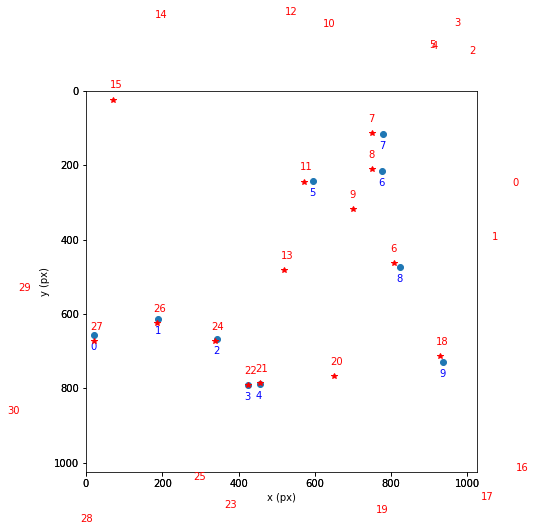

In [84]:
x_pix,y_pix = Test_initial(centroids,ra_list,dec_list,ra_center,dec_center,520,495)
ind_a,ind_b = Find_ind(centroids,x_pix,y_pix)
print(ind_a)
print(ind_b)

In [85]:
test_T = Calculate_T(centroids[ind_a,0:2],ra_list[ind_b],dec_list[ind_b],ra_center,dec_center)

In [86]:
a0 = Angle(ra_center, unit = 'hourangle')
a0 = a0.to(u.deg)
d0 = Angle(dec_center,u.deg)

ref_stars = []

for i,ind in enumerate(ind_a):
    ref_stars.append(ToClst(centroids[ind,0:2],test_T,a0,d0))

ref_stars = np.transpose(np.array(ref_stars))

In [87]:
asteroid_cent = calc_centroids_2d(asteroid_data, asteroid_peak)
asteroid_cent = np.array(asteroid_cent) # Convert List of list to 2D array

asteroid_coord = ToClst(asteroid_cent[0,0:2],test_T,a0,d0)
asteroid_coord

array([26.36008857,  5.80610824])

In [88]:
asteroid_cent[0,0:2]

array([531.96373186, 478.41608151])

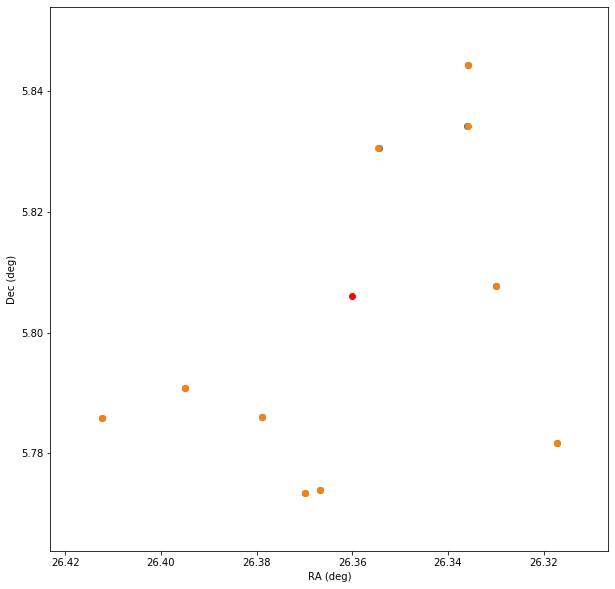

In [89]:
plt.figure(figsize=(10,10))
plt.scatter(ref_stars[0],ref_stars[1])
plt.scatter(ra_list[ind_b],dec_list[ind_b])
plt.scatter(asteroid_coord[0],asteroid_coord[1],c='r')
plt.xlabel("RA (deg)")
plt.ylabel("Dec (deg)")

plt.gca().invert_xaxis()
#plt.xlim(14.76,14.65)
#plt.ylim(7.700,7.720)

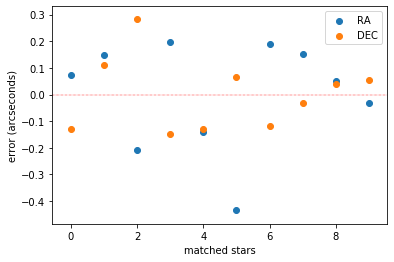

In [90]:
plt.scatter(range(len(ref_stars[0])),(ref_stars[0] - ra_list[ind_b])*3600,label='RA')
plt.scatter(range(len(ref_stars[0])),(ref_stars[1] - dec_list[ind_b])*3600,label='DEC')
plt.ylabel("error (arcseconds)")
plt.xlabel("matched stars")
plt.axhline(0,color='r',linewidth=0.4,ls='-.')
plt.legend()

In [91]:
metis_ref_stars_hr1 = ref_stars
metis_ra_hr1 = ra_list[ind_b]
metis_dec_hr1 = dec_list[ind_b]
T_metis_hr1 = test_T
metis_peak_hr1 = asteroid_peak
metis_coord_hr1 = asteroid_coord

# Metis hour 2

In [92]:
exp3 = [51,52,53,54,55]
exp30 = [56,57,58]

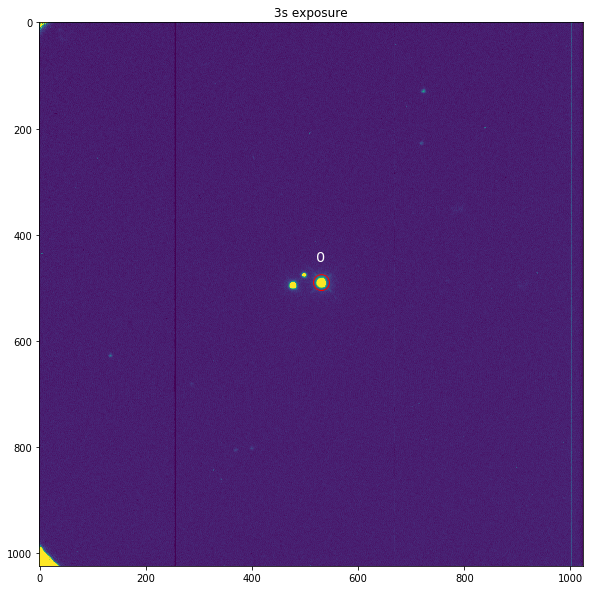

In [93]:
science_data = images_all[exp3[0]]
asteroid_data = science_data

peaks = find_star_locs(science_data, 10, 12, 1.3)


# print('index\tx\ty\n')
# for i in range(len(peaks)):
#     print('{}\t{}\t{}\t'.format(i,peaks[i][0],peaks[i][1]))
    
plt.figure(figsize=(10,10))

plt.title("{}s exposure".format(exposures[exp3[0]]))
plt.imshow(science_data,interpolation='nearest',vmin=0,vmax=500)

peaks = [x for i,x in enumerate(peaks) if i in [4]]

asteroid_peak = peaks

for i in range(len(peaks)):
    plt.text(peaks[i][0]-10,peaks[i][1]-40,str(i),size='x-large',c='white',ma='center')
    fig = plt.gcf()
    ax = fig.gca()
    ax.add_artist(plt.Circle((peaks[i][0], peaks[i][1]), 15, color='r',fill=False))

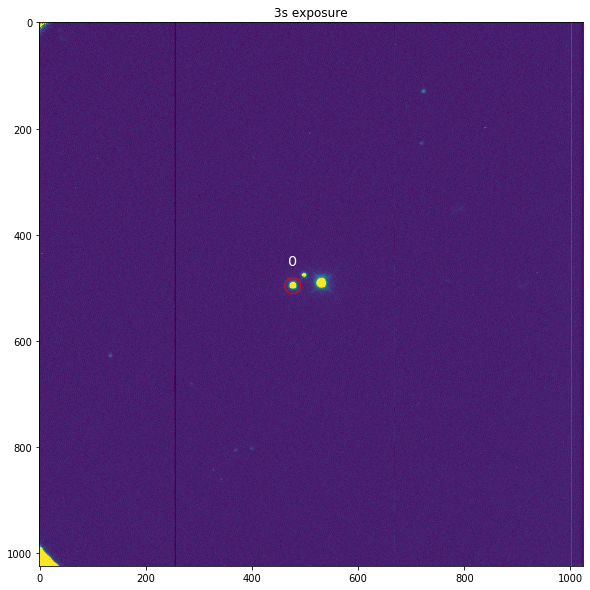

In [94]:
science_data = images_all[exp3[0]]

peaks = find_star_locs(science_data, 10, 12, 1.5)

    
plt.figure(figsize=(10,10))

plt.title("{}s exposure".format(exposures[exp3[0]]))
plt.imshow(science_data,interpolation='nearest',vmin=0,vmax=500)

peaks = [x for i,x in enumerate(peaks) if i in [4]]

peaks0 = peaks

for i in range(len(peaks)):
    plt.text(peaks[i][0]-10,peaks[i][1]-40,str(i),size='x-large',c='white',ma='center')
    fig = plt.gcf()
    ax = fig.gca()
    ax.add_artist(plt.Circle((peaks[i][0], peaks[i][1]), 15, color='r',fill=False))

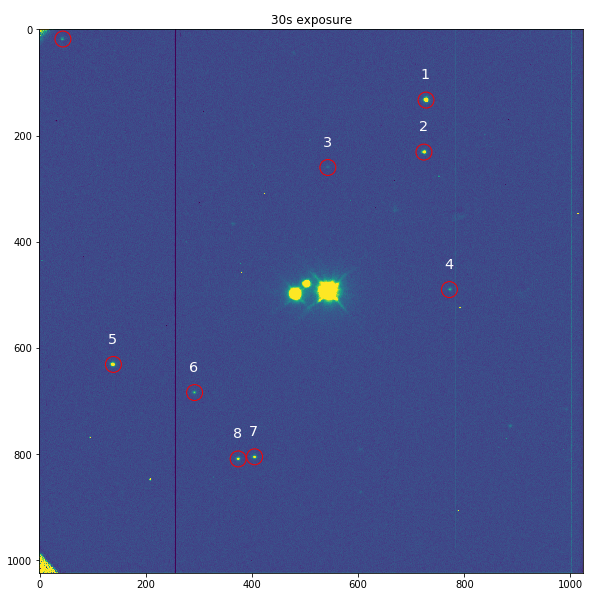

In [95]:
science_data = images_all[exp30[2]]
peaks = find_star_locs(science_data, 10, 10, 1.3)

    
plt.figure(figsize=(10,10))

plt.title("{}s exposure".format(exposures[exp30[1]]))
plt.imshow(science_data,interpolation='nearest',vmin=0,vmax=500)

peaks = [x for i,x in enumerate(peaks) if i in [0,1,2,3,7,14,15,17,16]]

peaks1 = peaks

for i in range(len(peaks)):
    plt.text(peaks[i][0]-10,peaks[i][1]-40,str(i),size='x-large',c='white',ma='center')
    fig = plt.gcf()
    ax = fig.gca()
    ax.add_artist(plt.Circle((peaks[i][0], peaks[i][1]), 15, color='r',fill=False))

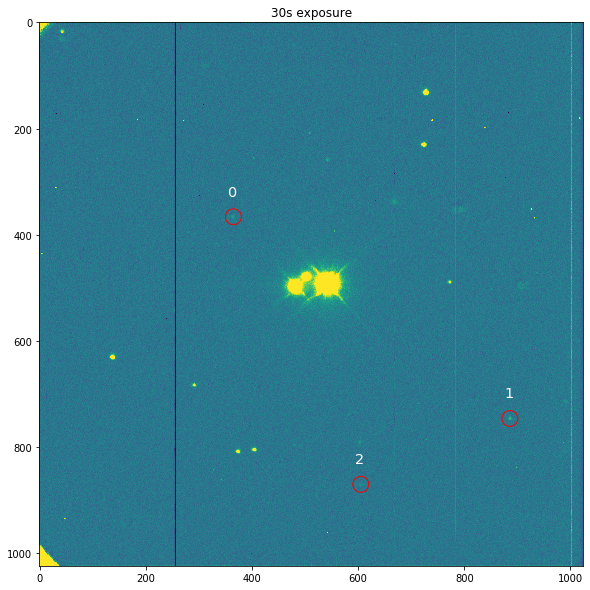

In [96]:
science_data = images_all[exp30[1]]
peaks = find_star_locs(science_data, 10, 5, 1.3,1)


    
plt.figure(figsize=(10,10))

plt.title("{}s exposure".format(exposures[exp30[1]]))
plt.imshow(science_data,interpolation='nearest',vmin=0,vmax=300)

peaks = [x for i,x in enumerate(peaks) if i in [25,112,123]]

peaks2 = peaks

for i in range(len(peaks)):
    plt.text(peaks[i][0]-10,peaks[i][1]-40,str(i),size='x-large',c='white',ma='center')
    fig = plt.gcf()
    ax = fig.gca()
    ax.add_artist(plt.Circle((peaks[i][0], peaks[i][1]), 15, color='r',fill=False))

In [97]:
ident_star_locs = peaks1 + peaks2
ident_star_locs.sort()

science_data = images_all[exp30[2]]
science_frame = data_files[exp30[2]]

bright_cents = calc_centroids_2d(images_all[exp3[0]], peaks0)


metis_cent_hr2 = calc_centroids_2d(science_data, ident_star_locs)
metis_cent_hr2 = np.concatenate((metis_cent_hr2,bright_cents))
#metis_cent_hr2 = np.array(metis_cent_hr2) # Convert List of list to 2D array
centroids = metis_cent_hr2

dataframe_header = ['Identified X','Identified Y',
                    'Centroid Xc','Uncertainity Xc','Centroid Yc','Uncertainity Yc']

# Construct a Dataframe for easily viewing the data
centroids_dataframe = pandas.DataFrame(np.hstack((ident_star_locs + peaks0,centroids[:,0:1],
                                                 centroids[:,2:3], centroids[:,1:2],
                                                 centroids[:,3:4])), columns=dataframe_header)
# Display the Pandas Data Frame
centroids_dataframe

,Identified X,Identified Y,Centroid Xc,Uncertainity Xc,Centroid Yc,Uncertainity Yc
0,44.0,18.0,43.698646,0.108986,17.630007,0.125876
1,139.0,631.0,138.598269,0.011674,630.658345,0.011509
2,292.0,684.0,291.651296,0.091598,683.562431,0.093177
3,365.0,366.0,364.481103,0.212559,365.668077,0.225354
4,374.0,809.0,373.965784,0.041511,808.524152,0.047191
5,405.0,805.0,404.763481,0.039031,804.604485,0.042495
6,543.0,260.0,542.477007,0.220023,259.438616,0.227398
7,605.0,870.0,604.580777,0.249073,869.568265,0.236641
8,724.0,231.0,724.148642,0.021689,230.808028,0.022171
9,728.0,133.0,727.913959,0.005960,132.748496,0.005936


In [98]:
hdu = fits.open(data_dir + science_frame)
science_ra_center = hdu[0].header['RA']
science_dec_center= hdu[0].header['DEC']
hdu.close()

print("RA  of science frame {}: {} (hr:mins:s)".format(science_frame, science_ra_center ))
print("Dec of science frame {}: {} degrees". format(science_frame, science_dec_center))
print("{} {}".format(science_ra_center,science_dec_center))

RA  of science frame d158.fits: 01:45:24.50 (hr:mins:s)
Dec of science frame d158.fits: 05:49:20.0 degrees
01:45:24.50 05:49:20.0


Total number of objects retrieved: 49
Column names: ['USNO-B1.0', 'RAJ2000', 'DEJ2000', 'e_RAJ2000', 'e_DEJ2000', 'Epoch', 'pmRA', 'pmDE', 'Ndet', 'B1mag', 'R1mag', 'B2mag', 'R2mag', 'Imag']


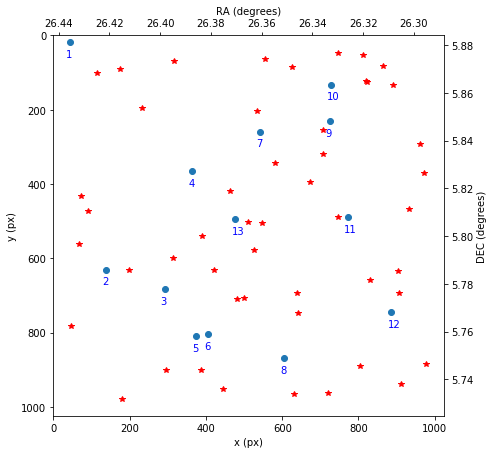

In [99]:
ra_center = '01 45 26.394'
dec_center = '+05 48 15.76'

ra_list,dec_list = Viz_coord(centroids,ra_center,dec_center,20.0,'9.0m') 

[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12]
[22, 43, 41, 19, 39, 38, 14, 34, 11, 10, 9, 31, 16]


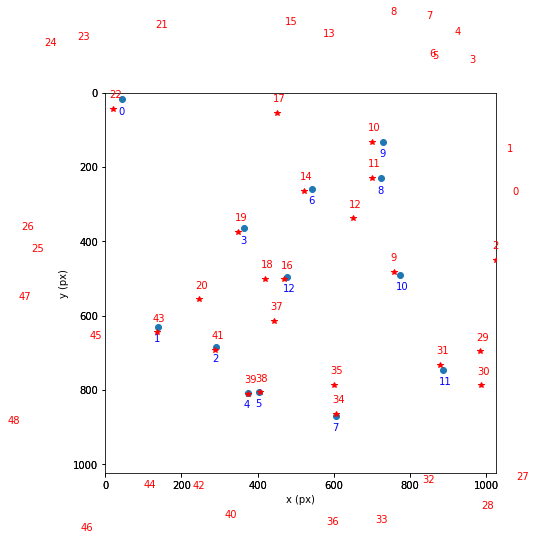

In [100]:
x_pix,y_pix = Test_initial(centroids,ra_list,dec_list,ra_center,dec_center,470,515)
ind_a,ind_b = Find_ind(centroids,x_pix,y_pix)
print(ind_a)
print(ind_b)

In [101]:
test_T = Calculate_T(centroids[ind_a,0:2],ra_list[ind_b],dec_list[ind_b],ra_center,dec_center)

In [102]:
a0 = Angle(ra_center, unit = 'hourangle')
a0 = a0.to(u.deg)
d0 = Angle(dec_center,u.deg)

ref_stars = []

for i,ind in enumerate(ind_a):
    ref_stars.append(ToClst(centroids[ind,0:2],test_T,a0,d0))

ref_stars = np.transpose(np.array(ref_stars))

In [103]:
asteroid_cent = calc_centroids_2d(asteroid_data, asteroid_peak)
asteroid_cent = np.array(asteroid_cent) # Convert List of list to 2D array

asteroid_coord = ToClst(asteroid_cent[0,0:2],test_T,a0,d0)
asteroid_coord

array([26.35482301,  5.80672539])

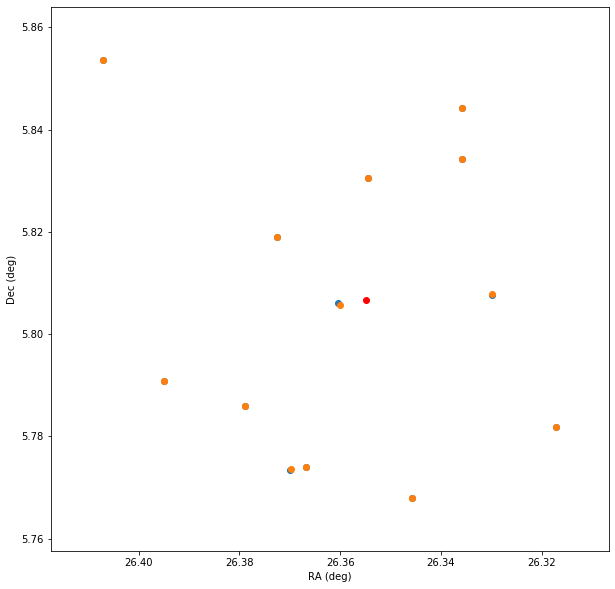

In [104]:
plt.figure(figsize=(10,10))
plt.scatter(ref_stars[0],ref_stars[1])
plt.scatter(ra_list[ind_b],dec_list[ind_b])
plt.scatter(asteroid_coord[0],asteroid_coord[1],c='r')
plt.xlabel("RA (deg)")
plt.ylabel("Dec (deg)")

plt.gca().invert_xaxis()
#plt.xlim(14.76,14.65)
#plt.ylim(7.700,7.720)

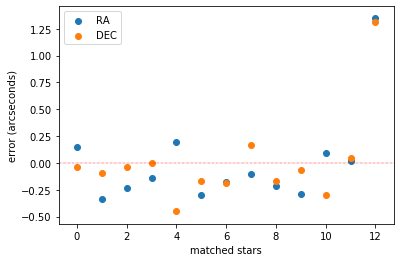

In [105]:
plt.scatter(range(len(ref_stars[0])),(ref_stars[0] - ra_list[ind_b])*3600,label='RA')
plt.scatter(range(len(ref_stars[0])),(ref_stars[1] - dec_list[ind_b])*3600,label='DEC')
plt.ylabel("error (arcseconds)")
plt.xlabel("matched stars")
plt.axhline(0,color='r',linewidth=0.4,ls='-.')
plt.legend()

In [106]:
metis_ref_stars_hr2 = ref_stars
metis_ra_hr2 = ra_list[ind_b]
metis_dec_hr2 = dec_list[ind_b]
T_metis_hr2 = test_T
metis_peak_hr2 = asteroid_peak
metis_coord_hr2 = asteroid_coord

# Metis hour 3

In [227]:
exp3 = [78,79,80,81,82]
exp30 = [83,84,85]

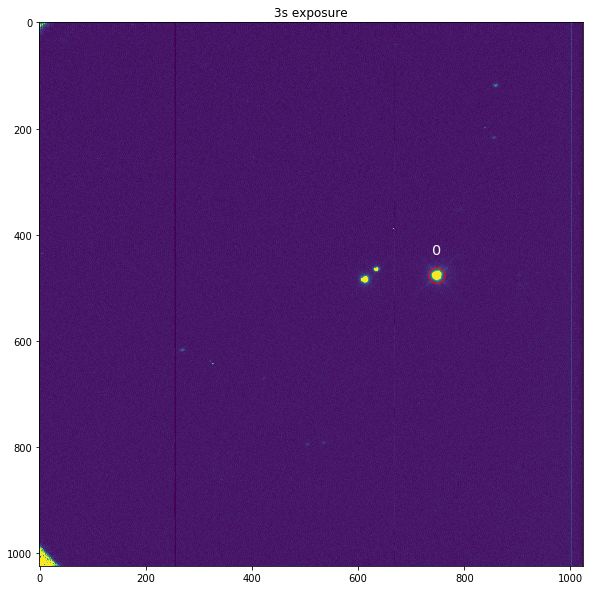

In [228]:
science_data = images_all[exp3[1]]
asteroid_data = science_data

peaks = find_star_locs(science_data, 10, 12, 1.3)


# print('index\tx\ty\n')
# for i in range(len(peaks)):
#     print('{}\t{}\t{}\t'.format(i,peaks[i][0],peaks[i][1]))
    
plt.figure(figsize=(10,10))

plt.title("{}s exposure".format(exposures[exp3[0]]))
plt.imshow(science_data,interpolation='nearest',vmin=0,vmax=500)

peaks = [x for i,x in enumerate(peaks) if i in [9]]

asteroid_peak = peaks

for i in range(len(peaks)):
    plt.text(peaks[i][0]-10,peaks[i][1]-40,str(i),size='x-large',c='white',ma='center')
    fig = plt.gcf()
    ax = fig.gca()
    ax.add_artist(plt.Circle((peaks[i][0], peaks[i][1]), 15, color='r',fill=False))

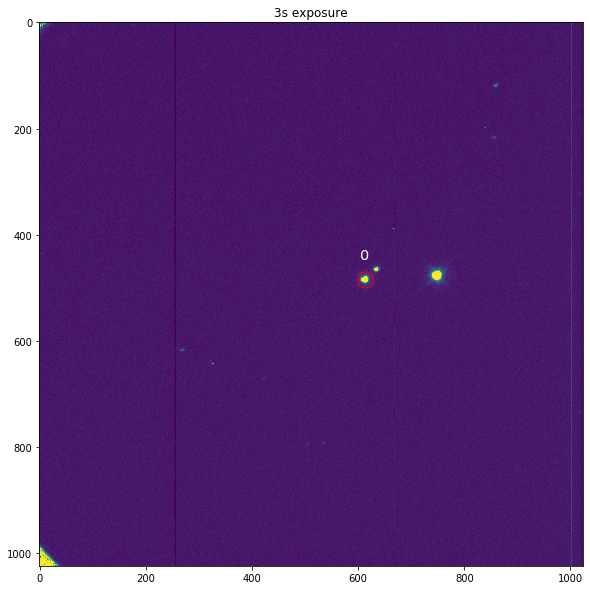

In [229]:
science_data = images_all[exp3[1]]

peaks = find_star_locs(science_data, 10, 12, 1.5)

    
plt.figure(figsize=(10,10))

plt.title("{}s exposure".format(exposures[exp3[0]]))
plt.imshow(science_data,interpolation='nearest',vmin=0,vmax=500)

peaks = [x for i,x in enumerate(peaks) if i in [5]]

peaks0 = peaks

for i in range(len(peaks)):
    plt.text(peaks[i][0]-10,peaks[i][1]-40,str(i),size='x-large',c='white',ma='center')
    fig = plt.gcf()
    ax = fig.gca()
    ax.add_artist(plt.Circle((peaks[i][0], peaks[i][1]), 15, color='r',fill=False))

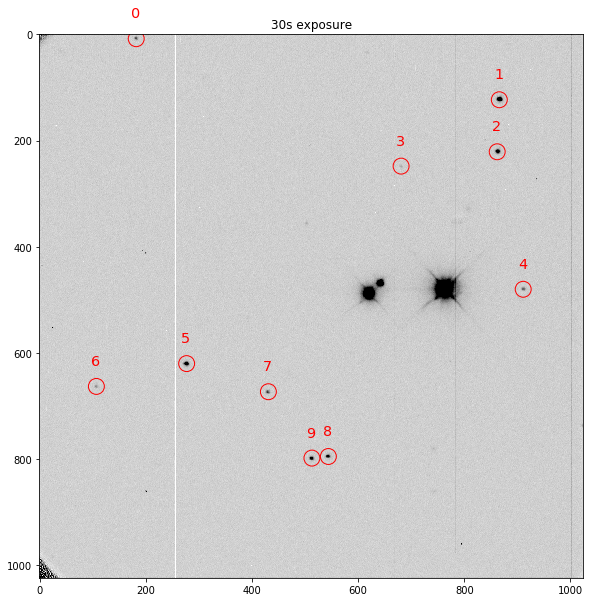

In [246]:
science_data = images_all[exp30[2]]
peaks = find_star_locs(science_data, 10, 10, 1.3)

    
plt.figure(figsize=(10,10))

plt.title("{}s exposure".format(exposures[exp30[1]]))
plt.imshow(science_data,interpolation='nearest',cmap='gray_r',vmin=0,vmax=500)

peaks = [x for i,x in enumerate(peaks) if i in [0,1,2,3,10,15,16,17,19,20]]

peaks1 = peaks

for i in range(len(peaks)):
    plt.text(peaks[i][0]-10,peaks[i][1]-40,str(i),size='x-large',c='red',ma='center')
    fig = plt.gcf()
    ax = fig.gca()
    ax.add_artist(plt.Circle((peaks[i][0], peaks[i][1]), 15, color='r',fill=False))

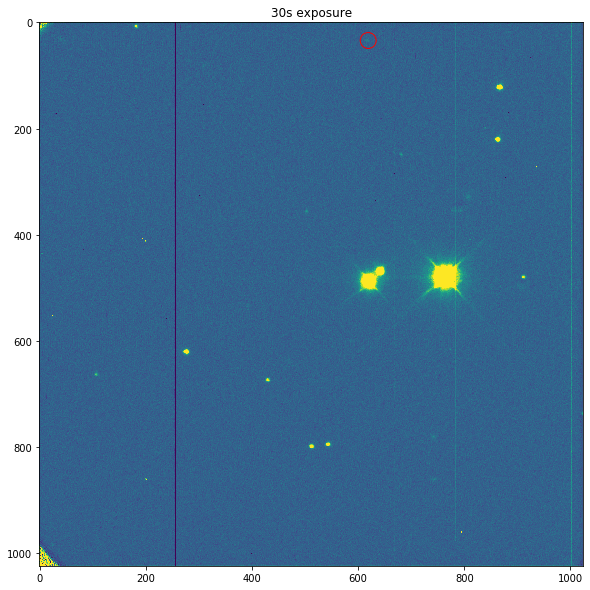

In [231]:
science_data = images_all[exp30[2]]
peaks = find_star_locs(science_data, 10, 5, 1.3,1)
    
plt.figure(figsize=(10,10))

plt.title("{}s exposure".format(exposures[exp30[1]]))
plt.imshow(science_data,interpolation='nearest',vmin=0,vmax=300)

peaks = [x for i,x in enumerate(peaks) if i in [6]]

peaks2 = peaks

for i in range(len(peaks)):
    plt.text(peaks[i][0]-10,peaks[i][1]-40,str(i),size='x-large',c='white',ma='center')
    fig = plt.gcf()
    ax = fig.gca()
    ax.add_artist(plt.Circle((peaks[i][0], peaks[i][1]), 15, color='r',fill=False))

In [232]:
ident_star_locs = peaks1 + peaks2
ident_star_locs.sort()

science_data = images_all[exp30[2]]
science_frame = data_files[exp30[2]]

bright_cents = calc_centroids_2d(images_all[exp3[0]], peaks0)


metis_cent_hr2 = calc_centroids_2d(science_data, ident_star_locs)
metis_cent_hr2 = np.concatenate((metis_cent_hr2,bright_cents))
#metis_cent_hr2 = np.array(metis_cent_hr2) # Convert List of list to 2D array
centroids = metis_cent_hr2

dataframe_header = ['Identified X','Identified Y',
                    'Centroid Xc','Uncertainity Xc','Centroid Yc','Uncertainity Yc']

# Construct a Dataframe for easily viewing the data
centroids_dataframe = pandas.DataFrame(np.hstack((ident_star_locs + peaks0,centroids[:,0:1],
                                                 centroids[:,2:3], centroids[:,1:2],
                                                 centroids[:,3:4])), columns=dataframe_header)
# Display the Pandas Data Frame
centroids_dataframe

,Identified X,Identified Y,Centroid Xc,Uncertainity Xc,Centroid Yc,Uncertainity Yc
0,107.0,663.0,106.827340,0.155414,662.499203,0.163433
1,182.0,8.0,181.718146,0.091388,7.815958,0.071198
2,277.0,620.0,276.827588,0.009427,620.072099,0.008483
3,431.0,673.0,430.469773,0.077701,672.726466,0.088756
4,513.0,798.0,512.623167,0.035219,797.772544,0.038894
5,544.0,795.0,543.502855,0.032691,794.442931,0.034762
6,619.0,34.0,618.320759,0.282385,33.517016,0.289007
7,681.0,248.0,680.632186,0.247986,247.621907,0.250475
8,862.0,221.0,862.633407,0.018991,220.381891,0.020243
9,866.0,123.0,866.451311,0.005232,122.227293,0.004669


In [233]:
hdu = fits.open(data_dir + science_frame)
science_ra_center = hdu[0].header['RA']
science_dec_center= hdu[0].header['DEC']
hdu.close()

print("RA  of science frame {}: {} (hr:mins:s)".format(science_frame, science_ra_center ))
print("Dec of science frame {}: {} degrees". format(science_frame, science_dec_center))
print("{} {}".format(science_ra_center,science_dec_center))

RA  of science frame d185.fits: 01:45:24.50 (hr:mins:s)
Dec of science frame d185.fits: 05:49:20.0 degrees
01:45:24.50 05:49:20.0


Total number of objects retrieved: 51
Column names: ['USNO-B1.0', 'RAJ2000', 'DEJ2000', 'e_RAJ2000', 'e_DEJ2000', 'Epoch', 'pmRA', 'pmDE', 'Ndet', 'B1mag', 'R1mag', 'B2mag', 'R2mag', 'Imag']


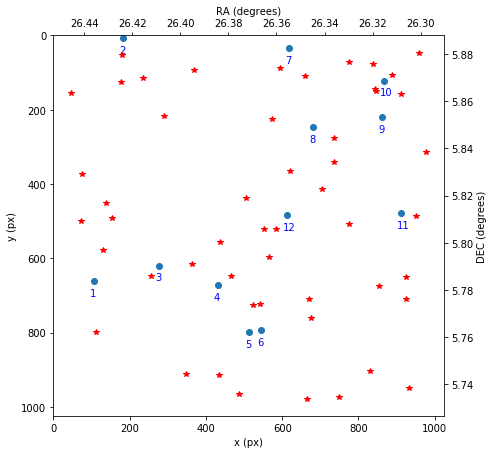

In [234]:
ra_center = '01 45 29.264'
dec_center = '+05 48 26.70'

ra_list,dec_list = Viz_coord(centroids,ra_center,dec_center,20.0,'9.0m') 

[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[48, 22, 46, 44, 42, 41, 17, 14, 11, 10, 9, 16]


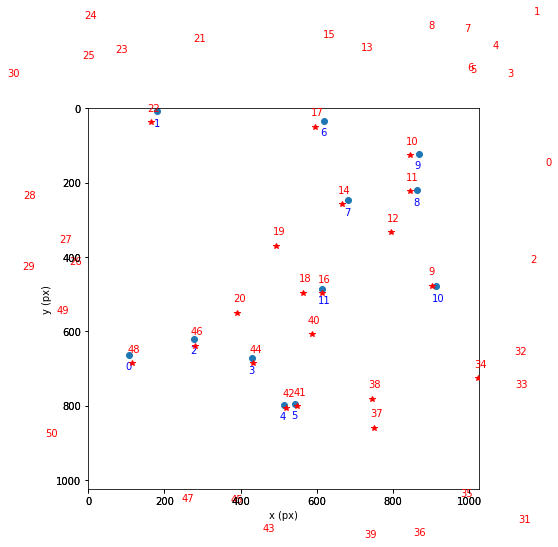

In [235]:
x_pix,y_pix = Test_initial(centroids,ra_list,dec_list,ra_center,dec_center,500,480)
ind_a,ind_b = Find_ind(centroids,x_pix,y_pix)
print(ind_a)
print(ind_b)

In [236]:
test_T = Calculate_T(centroids[ind_a,0:2],ra_list[ind_b],dec_list[ind_b],ra_center,dec_center)

In [237]:
a0 = Angle(ra_center, unit = 'hourangle')
a0 = a0.to(u.deg)
d0 = Angle(dec_center,u.deg)

ref_stars = []

for i,ind in enumerate(ind_a):
    ref_stars.append(ToClst(centroids[ind,0:2],test_T,a0,d0))

ref_stars = np.transpose(np.array(ref_stars))

In [238]:
asteroid_cent = calc_centroids_2d(asteroid_data, asteroid_peak)
asteroid_cent = np.array(asteroid_cent) # Convert List of list to 2D array

asteroid_coord = ToClst(asteroid_cent[0,0:2],test_T,a0,d0)
asteroid_coord

array([26.34669598,  5.80732806])

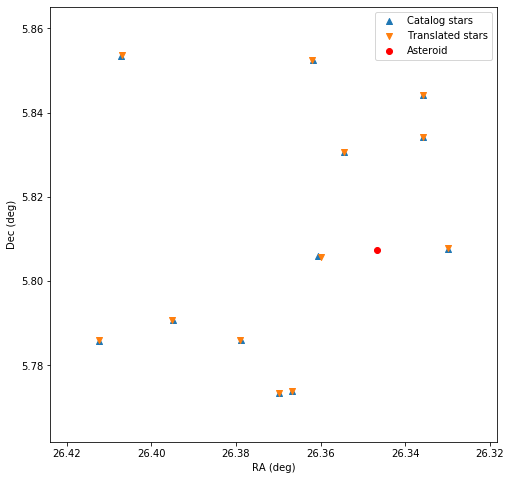

In [247]:
plt.figure(figsize=(8,8))
plt.scatter(ref_stars[0],ref_stars[1],marker='^',label='Catalog stars')
plt.scatter(ra_list[ind_b],dec_list[ind_b],marker='v',label='Translated stars')
plt.scatter(asteroid_coord[0],asteroid_coord[1],c='r',label='Asteroid')
plt.xlabel("RA (deg)")
plt.ylabel("Dec (deg)")
plt.legend()

plt.gca().invert_xaxis()
#plt.xlim(14.76,14.65)
#plt.ylim(7.700,7.720)

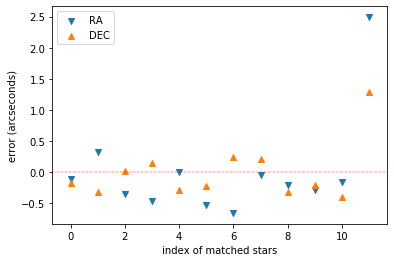

In [249]:
plt.scatter(range(len(ref_stars[0])),(ref_stars[0] - ra_list[ind_b])*3600,marker='v',label='RA')
plt.scatter(range(len(ref_stars[0])),(ref_stars[1] - dec_list[ind_b])*3600,marker='^',label='DEC')
plt.ylabel("error (arcseconds)")
plt.xlabel("index of matched stars")
plt.axhline(0,color='r',linewidth=0.4,ls='-.')
plt.legend()

In [241]:
metis_ref_stars_hr3 = ref_stars
metis_ra_hr3 = ra_list[ind_b]
metis_dec_hr3 = dec_list[ind_b]
T_metis_hr3 = test_T
metis_peak_hr3 = asteroid_peak
metis_coord_hr3 = asteroid_coord

# Residuals

In [339]:
metis_coord_hr1

array([26.36008857,  5.80610824])

In [340]:
3600/2

1800.0

In [122]:
# poly_ref_stars_hr3 = ref_stars
# poly_ra_hr3 = ra_list[ind_b]
# poly_dec_hr3 = dec_list[ind_b]
# T_poly_hr3 = test_T
# poly_peak_hr3 = asteroid_peak
# poly_coord_hr3 = asteroid_coord

In [123]:
measured_ra = np.concatenate((poly_ref_stars_hr1[0],poly_ref_stars_hr2[0],poly_ref_stars_hr3[0],poly_ref_stars_hr4[0],
                              metis_ref_stars_hr1[0],metis_ref_stars_hr2[0],metis_ref_stars_hr3[0]))
measured_dec = np.concatenate((poly_ref_stars_hr1[1],poly_ref_stars_hr2[1],poly_ref_stars_hr3[1],poly_ref_stars_hr4[1],
                              metis_ref_stars_hr1[1],metis_ref_stars_hr2[1],metis_ref_stars_hr3[1]))
true_ra = np.concatenate((poly_ra_hr1,poly_ra_hr2,poly_ra_hr3,poly_ra_hr4,
                          metis_ra_hr1,metis_ra_hr2,metis_ra_hr3))
true_dec = np.concatenate((poly_dec_hr1,poly_dec_hr2,poly_dec_hr3,poly_dec_hr4,
                          metis_dec_hr1,metis_dec_hr2,metis_dec_hr3))

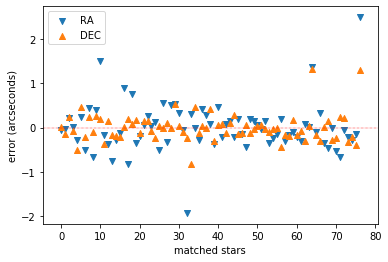

In [124]:
plt.scatter(range(len(true_ra)),(measured_ra - true_ra)*3600,marker='v',label='RA')
plt.scatter(range(len(true_dec)),(measured_dec - true_dec)*3600,marker='^',label='DEC')
plt.ylabel("error (arcseconds)")
plt.xlabel("matched stars")
plt.axhline(0,color='r',linewidth=0.4,ls='-.')
plt.legend()

In [125]:
np.where((measured_ra - true_ra)*3600 > 1)[0]

array([10, 64, 76])

In [126]:
measured_ra = np.delete(measured_ra,[56,68])
measured_dec = np.delete(measured_dec,[56,68])
true_ra = np.delete(true_ra,[56,68])
true_dec = np.delete(true_dec,[56,68])

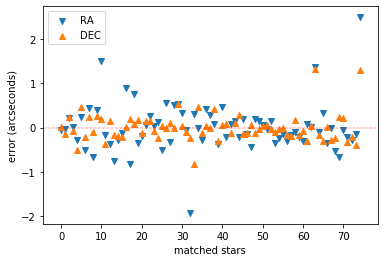

In [127]:
plt.scatter(range(len(true_ra)),(measured_ra - true_ra)*3600,marker='v',label='RA')
plt.scatter(range(len(true_dec)),(measured_dec - true_dec)*3600,marker='^',label='DEC')
plt.ylabel("error (arcseconds)")
plt.xlabel("matched stars")
plt.axhline(0,color='r',linewidth=0.4,ls='-.')
#plt.ylim(-0.85,0.85)
plt.legend()

# Asteroid motion

In [316]:
metis_motion = np.transpose(np.array([metis_coord_hr1,metis_coord_hr2,metis_coord_hr3]))

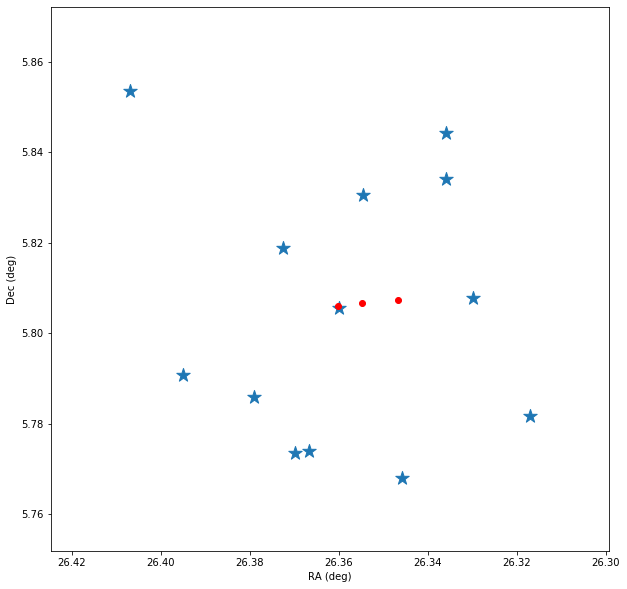

In [317]:
plt.figure(figsize=(10,10))
plt.scatter(metis_ra_hr2,metis_dec_hr2,marker='*',s=200)
# plt.scatter(ra_list[ind_b],dec_list[ind_b])
plt.scatter(metis_motion[0],metis_motion[1],c='r')
plt.xlabel("RA (deg)")
plt.ylabel("Dec (deg)")

plt.gca().invert_xaxis()
#plt.xlim(14.76,14.65)
#plt.ylim(7.700,7.720)

In [318]:
metis_times = np.array([3*60 + 20,4*60 + 15,5*60 + 22])
metis_times

array([200, 255, 322])

Text(0, 0.5, 'RA (degrees)')

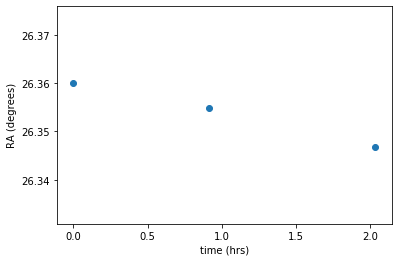

In [319]:
plt.scatter((metis_times-metis_times[0])/60,metis_motion[0])
plt.xlabel("time (hrs)")
plt.ylabel("RA (degrees)")

Text(0, 0.5, 'Dec (degrees)')

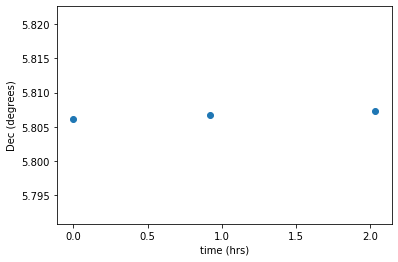

In [320]:
plt.scatter((metis_times-metis_times[0])/60,metis_motion[1])
plt.xlabel("time (hrs)")
plt.ylabel("Dec (degrees)")

In [321]:
t = np.arange(0,2.2,0.1)

In [322]:
m_ra = (metis_motion[0][2] - metis_motion[0][0])/((metis_times[2]-metis_times[0])/60)
print(m_ra*3600,'degrees/hour ra')
metis_ra_line = m_ra*t + metis_motion[0][0]

m_dec = (metis_motion[1][2] - metis_motion[1][0])/((metis_times[2]-metis_times[0])/60)
print(m_dec*3600,'degrees/hour dec')
metis_dec_line = m_dec*t + metis_motion[1][0]

-23.71147313628284 degrees/hour ra
2.159679412671511 degrees/hour dec


In [323]:
metis_total = (m_dec**2 + m_ra**2)**(1/2)
metis_total*3600

23.809623547174784

(5.805, 5.808)

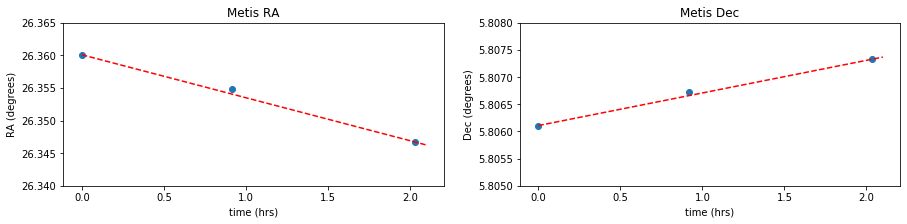

In [295]:
plt.figure(figsize=(15,3))

plt.subplot(1,2,1)
plt.title("Metis RA")
plt.scatter((metis_times-metis_times[0])/60,metis_motion[0])
plt.plot(t,metis_ra_line,c='r',ls='--')
plt.xlabel("time (hrs)")
plt.ylabel("RA (degrees)")
plt.ylim(26.34,26.365)

plt.subplot(1,2,2)
plt.title("Metis Dec")
plt.scatter((metis_times-metis_times[0])/60,metis_motion[1])
plt.plot(t,metis_dec_line,c='r',ls='--')
plt.xlabel("time (hrs)")
plt.ylabel("Dec (degrees)")
plt.ylim(5.805,5.808)

In [329]:
metis_error_ra = [metis_ref_stars_hr1[0]-metis_ra_hr1,metis_ref_stars_hr2[0]-metis_ra_hr2,\
                  metis_ref_stars_hr3[0]-metis_ra_hr3]
metis_error_dec = [metis_ref_stars_hr1[1]-metis_dec_hr1,metis_ref_stars_hr2[1]-metis_dec_hr2,\
                  metis_ref_stars_hr3[1]-metis_dec_hr3]

metis_error = [metis_ref_stars_hr1[0]-metis_ra_hr1,metis_ref_stars_hr2[0]-metis_ra_hr2,\
                  metis_ref_stars_hr3[0]-metis_ra_hr3,metis_ref_stars_hr1[1]-metis_dec_hr1,metis_ref_stars_hr2[1]-metis_dec_hr2,\
                  metis_ref_stars_hr3[1]-metis_dec_hr3]

for i in range(len(metis_error_ra)):
    metis_error_ra[i] = np.sqrt(np.mean(np.square(metis_error_ra[i])))
    
for i in range(3):
    metis_error_dec[i] = np.sqrt(np.mean(np.square(metis_error_dec[i])))
    
for i in range(len(metis_error)):
    metis_error[i] = np.sqrt(np.mean(np.square(metis_error[i])))

In [336]:
np.mean(metis_error_dec)

9.098326730061128e-05

In [297]:
for i in range(len(metis_error_ra)):
    metis_error_ra[i] = np.sqrt(np.mean(np.square(metis_error_ra[i])))
    
for i in range(3):
    metis_error_dec[i] = np.sqrt(np.mean(np.square(metis_error_dec[i])))

In [298]:
metis_error_ra

[5.4269544714101467e-05, 0.00011809826070352564, 0.00022003269385684855]

In [299]:
# a_ra = np.transpose(np.matrix([metis_coord_hr1[0],metis_coord_hr2[0],metis_coord_hr3[0]]))
# B = np.transpose(np.matrix(metis_times))
# c_ra = (B.T*B).I*B.T*a_ra

# metis_v_ra = c_ra.item(0)
# metis_v_ra

# a_dec = np.transpose(np.matrix([metis_coord_hr1[1],metis_coord_hr2[1],metis_coord_hr3[1]]))
# B = np.transpose(np.matrix(metis_times))
# c_dec = (B.T*B).I*B.T*a_dec

# metis_v_dec = c_dec.item(0)
# metis_v_dec

In [300]:
# metis_v = (metis_v_ra**2 + metis_v_dec**2)**(1/2) #in degrees per min
# print(metis_v*60," arcmin/min or degrees/hour")
# print(metis_v*3600*60," arcsec/hour")

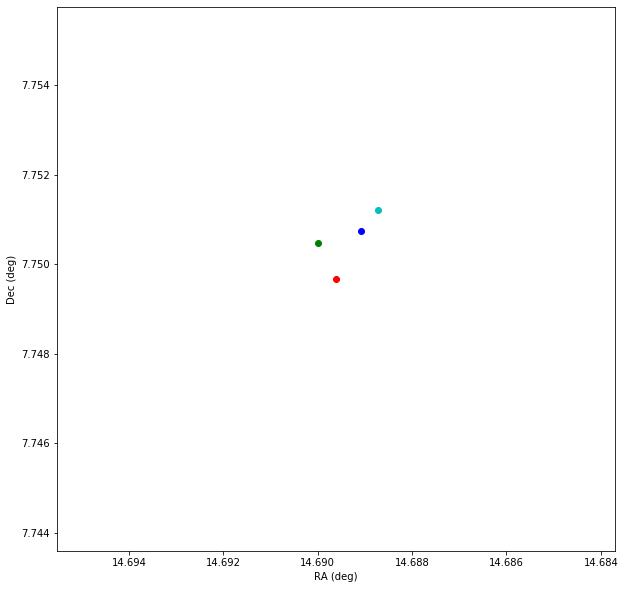

In [301]:
poly_motion = np.transpose(np.array([poly_coord_hr1,poly_coord_hr2,poly_coord_hr3,poly_coord_hr4]))

plt.figure(figsize=(10,10))
#plt.scatter(poly_ra_hr2,poly_dec_hr2,marker='*',s=200)
# plt.scatter(ra_list[ind_b],dec_list[ind_b])
plt.scatter(poly_motion[0][0],poly_motion[1][0],c='r')
plt.scatter(poly_motion[0][1],poly_motion[1][1],c='g')
plt.scatter(poly_motion[0][2],poly_motion[1][2],c='b')
plt.scatter(poly_motion[0][3],poly_motion[1][3],c='c')
plt.xlabel("RA (deg)")
plt.ylabel("Dec (deg)")

plt.gca().invert_xaxis()
#plt.xlim(14.72,14.66)
#plt.ylim(7.72,7.78)

In [302]:
poly_motion = np.transpose(np.array([poly_coord_hr1,poly_coord_hr3,poly_coord_hr4]))

In [303]:
#poly_times = np.array([2*60 + 43,3*60 + 40,4*60 + 34,5*60 + 32])
poly_times = np.array([2*60 + 43,4*60 + 34,5*60 + 32])
poly_times

array([163, 274, 332])

(14.688, 14.69)

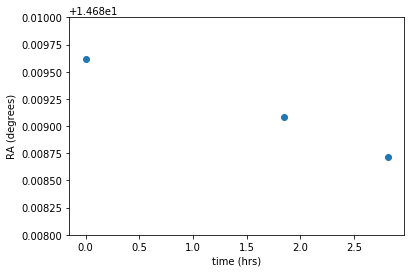

In [304]:
plt.scatter((poly_times-poly_times[0])/60,poly_motion[0])
plt.xlabel("time (hrs)")
plt.ylabel("RA (degrees)")
plt.ylim(14.688,14.690)

(7.748, 7.752)

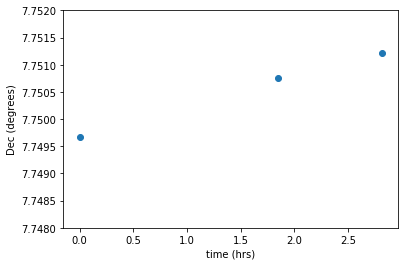

In [305]:
plt.scatter((poly_times-poly_times[0])/60,poly_motion[1])
plt.xlabel("time (hrs)")
plt.ylabel("Dec (degrees)")
plt.ylim(7.748,7.752)

In [324]:
t = np.arange(0,3.1,0.1)
poly_m_ra = (poly_motion[0][2] - poly_motion[0][0])/((poly_times[2]-poly_times[0])/60)
print(poly_m_ra*3600,'degrees/hour ra')
poly_ra_line = poly_m_ra*t + poly_motion[0][0]

poly_m_dec = (poly_motion[1][2] - poly_motion[1][0])/((poly_times[2]-poly_times[0])/60)
print(poly_m_dec*3600,'degrees/hour dec')
poly_dec_line = poly_m_dec*t + poly_motion[1][0]

-1.1439939444341074 degrees/hour ra
1.96624525342728 degrees/hour dec


In [314]:
poly_total = (poly_m_dec**2 + poly_m_ra**2)**(1/2)
poly_total*3600

2.2748280246047647

(7.748, 7.752)

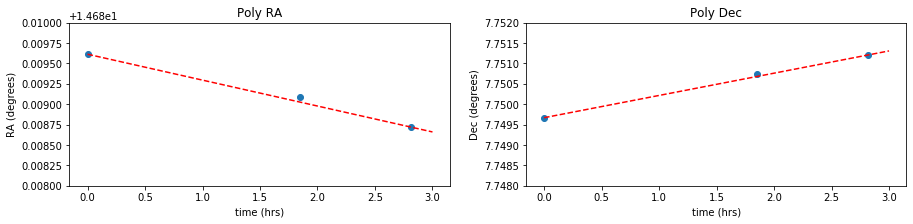

In [308]:
plt.figure(figsize=(15,3))

plt.subplot(1,2,1)
plt.title("Poly RA")
plt.scatter((poly_times-poly_times[0])/60,poly_motion[0])
plt.plot(t,poly_ra_line,c='r',ls='--')
plt.xlabel("time (hrs)")
plt.ylabel("RA (degrees)")
plt.ylim(14.688,14.690)

plt.subplot(1,2,2)
plt.title("Poly Dec")
plt.scatter((poly_times-poly_times[0])/60,poly_motion[1])
plt.plot(t,poly_dec_line,c='r',ls='--')
plt.xlabel("time (hrs)")
plt.ylabel("Dec (degrees)")
plt.ylim(7.748,7.752)

In [333]:
poly_error_ra = [poly_ref_stars_hr1[0]-poly_ra_hr1,poly_ref_stars_hr2[0]-poly_ra_hr2,\
                  poly_ref_stars_hr3[0]-poly_ra_hr3]
poly_error_dec = [poly_ref_stars_hr1[1]-poly_dec_hr1,poly_ref_stars_hr2[1]-poly_dec_hr2,\
                  poly_ref_stars_hr3[1]-poly_dec_hr3]

poly_error = [poly_ref_stars_hr1[0]-poly_ra_hr1,poly_ref_stars_hr2[0]-poly_ra_hr2,\
                  poly_ref_stars_hr3[0]-poly_ra_hr3,poly_ref_stars_hr1[1]-poly_dec_hr1,poly_ref_stars_hr2[1]-poly_dec_hr2,\
                  poly_ref_stars_hr3[1]-poly_dec_hr3]

for i in range(len(poly_error_ra)):
    poly_error_ra[i] = np.sqrt(np.mean(np.square(poly_error_ra[i])))
    
for i in range(3):
    poly_error_dec[i] = np.sqrt(np.mean(np.square(poly_error_dec[i])))
    
for i in range(len(poly_error)):
    poly_error[i] = np.sqrt(np.mean(np.square(poly_error[i])))

In [338]:
np.mean(poly_error_dec)

5.623570139213718e-05